# Dunnart neural activity analysis
This notebook and accompanying code runs the computational analysis for our study:

> Suárez, R. et al. Cortical activity emerges in region-specific patterns during early brain development. *Proceedings of the National Academy of Sciences* 120, e2208654120 (2023), doi: 10.1073/pnas.2208654120.

Please see our paper for details of our computational methods, and refer to the README for further details about this research project, how to cite this code, and information on how to download the experimental data.

## <u>INDEX</u>
*This index is intended to help readers identify the sections of code used to generate each result/figure in the published paper. It is not an ordered table of contents for this notebook. All cells must be run in order to generate the results.*

* Preamble
  * [Import statements](#preamble)
  * [Environment setup](#env)
  * [Plot setup](#plot)
* Importing data and image processing.
  * [Import lookup table](#lookup)
  * [Extract $\Delta F/F$ from imaging data](#dff)
  * [Extract binary neural activity from $\Delta F/F$](#binarise)
* **Figure 2:** The onset and maturation of patchwork activity in the dunnart somatosensory cortex occurs between stages 23 and 25
  * [Gaussian graphical modelling](#networks)
  * [Community detection for estimating neuronal ensembles](#community)
  * [Example network visualisation](#netvis)
  * [Network and ensemble visualisations (Figure 2a)](#netvisdev)
  * [Computing network properties](#netprops)
  * [Correlation versus distance (Figure 2b)](#corrdist)
  * [Network and ensemble properties (Figure 2c)](#netplots)
* **Figure 3:** Onset and maturation of travelling waves in the dunnart visual cortex occurs between stages 25 and 27.
  * [Tracking waves and measuring wave properties](#wavetrack)
  * [Wave trajectories and vector field plots (Figure 3b)](#wavetraj)
  * [Wave properties (Figure 3c)](#waveplots)
  * [Wave direction histograms and directional statistics (Figure 3d)](#wavedir)
* **Figure 4:** The emergence and specification of early neural activity in SS precedes that of VIS.
  * [Dimensional reduction and embedding of of individual calcium transients (Figure 4c)](#transients)
  * [Comparing $\Delta F/F$ between regions over development (Figure 4d)](#meandff)
* **Figure 5:** Developmental progression of correlated activity between somatosensory and visual cortex.
  * [LDA and MANOVA on reduced feature set at stages 26-27, including LASSO regression for feature selection (Figure 5a)](#regionlda)
  * [PCA on activity features (Figure 5b)](#regionpca)
  * [Activity feature profiles (Figure 5c)](#regionprofile)
* **Supplementary Figure S3:** Automated detection and tracking of waves.
  * [Wave tracking illustration (Figure 3a and S3a)](#wavemov)
  * [Additional wave properties (Figure S3b)](#waveplots)
* **Supplementary Figure S5:** Local calcium transients differ between regions from earliest pre-onset and onset activity.
  * [t-SNE embeddings of calcium transients (Figure S6a-c)](#transients)
* **Supplementary Figure S6:** Principal component analysis of neural activity features and dimensionality reduction using LASSO regression.
  * [LASSO regression analysis (Figure S6a-b)](#regionlda)
  * [Principal component weights (Figure S6c)](#regionpca)
* **Supplementary Movie S3:** Automated tracking of wave trajectories in VIS from a dunnart at stage 27 (postnatal day 39).
  * [Generation of wave tracking movie](#wavemov)
* Other.
  * [Various example imaging data, $\Delta F/F$ traces and raster plots](#other)




## Preamble

<a id='preamble'></a>
### Import statements

In [1]:
# # File I/O and utility
import glob
import os
from pathlib import Path
import czifile as cz
import tifffile as tf
from itertools import compress, chain
import time
from copy import deepcopy
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning) 

# Computation
import numpy as np
import re
import pandas as pd
import networkx as nx

# Custom modules
from plottools.format import pvalue_str, plot_overline
from caimaging.tools import get_voxel_dff, binarise_dff
from fcnetwork.ggm import GridSearchBIC, partial_corr_from_precision
from fcnetwork.stats import (
    edge_weights_inverse,
    list_communities,
)
from fcnetwork.networkvis import (
    adjacency_communities,
    community_map,
    network_embedding,
)
from wavetrack.wave_cc import (
    label_cc,
    wave_peak_tracker,
    trajectory_length,
    mean_trajectory_angle,
)
from wavetrack.direction_stats import (
    omnibus,
    hermans_rasson,
)
from wavetrack.wave_vis import (
    wave_trajectories,
    vector_field,
    vector_field_plot
)
from plottools.customplot import (
    bar_plot3,
    stacked_histogram
)

# Additional computation and statistics
from scipy import ndimage
from scipy.ndimage import  percentile_filter
from scipy.stats import (
    sem,
    binned_statistic,
    binned_statistic_2d,
    ranksums,
    linregress,
    ttest_ind,
    levene,
    zscore,
)
from scipy.spatial.distance import pdist,squareform
from scipy.linalg import block_diag
from sklearn.neighbors import KernelDensity
from sklearn.model_selection import GridSearchCV, KFold, RepeatedKFold
from filterpy import kalman
from filterpy.common import Q_discrete_white_noise
from pycircstat.tests import rayleigh, raospacing
import community as community_louvain
from skimage.morphology import remove_small_objects
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.cross_decomposition import CCA
from sklearn.linear_model import Lasso, LassoCV
from sklearn.manifold import MDS, TSNE
from sklearn import preprocessing
from statsmodels.multivariate.manova import MANOVA

# Plotting and display
from tqdm import tqdm
from IPython.display import set_matplotlib_formats
from IPython import display
import matplotlib.pyplot as plt
import matplotlib.font_manager
import matplotlib_inline
from matplotlib import cm
from matplotlib import transforms
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.animation import FFMpegWriter
from matplotlib.pyplot import *
from matplotlib import lines
import matplotlib as mpl
import pylab as pl

<a id='env'></a>
### Set environment

In [2]:
# Environment (set paths as required)
datapath = Path('/mnt/scratch/dunnart/raw-2p/') # path to raw data
scratchpath = Path('/mnt/scratch/dunnart/intermediate_files/')
if not os.path.exists(scratchpath):
    os.makedirs(scratchpath)
figpath = Path('/mnt/scratch/dunnart/figs/')
if not os.path.exists(figpath):
    os.makedirs(figpath)

<a id='plot'></a>
### Plot setup

In [3]:
# Plot setup
%matplotlib inline
%config InlineBackend.figure_format='retina'
matplotlib_inline.backend_inline.set_matplotlib_formats('png', 'pdf')
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 14}
matplotlib.rc('font', **font)

# Presentation plotting
if False:
    plt.style.use('dark_background')
    axcolor = 'w'
else:
    plt.style.use('default')
    axcolor = 'k'
    
# Global plotting parameters
pval_format = 'asterisk'

## Importing data and image processing

<a id='lookup'></a>
### Importing the lookup table
Note that recordings labelled as "poor signal" or "Activity of some kind" are excluded. These contain non-physiological data (i.e., imaging artefacts or noise).

In [4]:
# Import the lookup table
df = pd.read_excel(
         (
             datapath
             / 'dunnart_lookup_table.xlsx'
         ),
         header=0,
         sheet_name='lookup',
         skiprows=0,
         usecols = lambda x: 'Unnamed' not in x
     )

# Strip apostrophes from string variables
for key in df.keys():
    if df[key].dtype == object:
        df[key] = df[key].str.strip("'")
        
# Keep only EP details = 'normal'
df = df[df['EP details']=='normal']

# Strip trailing whitespace in Activity Features
df['Activity Features'] = df['Activity Features'].str.strip()

# Keep Early synchronous, Patchwork, Travelling and No activity
df = df[df['Activity Features'].str.contains(
                                    ('synchronous|patchwork'
                                     '|travelling|no activity'
                                    ),
                                    flags=re.IGNORECASE,
                                    regex=True
                                )
       ]

# Fix case on no activity
df['Activity Features'].replace(
                            'no activity',
                            'No activity',
                            inplace=True
                        )

# Keep only separate S1 and V1 imaging, NOT S1/V1 combined
df = df[df['Location'].isin(['S1','V1'])]

# Remove the single sample at stage 28 (not included in analysis)
df = df[df['Stage']<28]

# Append data path
files = [
            list(
                (
                    datapath
                    / MATLABID
                    / 'raw'
                ).glob(MATLABID+'*')
            )
            for MATLABID
            in df['Matlab ID']
        ]
files = [str(f[0]) if f else '' for f in files]
df['fpath'] = files

# Drop data if data files not found
df = df[df['fpath']!='']
df.reset_index(drop=True,inplace=True)

<a id='dff'></a>
### Importing data and extracting $\frac{\Delta F}{F}$
We extract $\frac{\Delta F}{F}$ for $25\times 25$ px regions of interest (ROIs; $16\times 12=192$ ROIs in the image). Method as implemented in `get_voxel_dff`:
* Compute the mean fluorescence $F$ per ROI.
* Estimate baseline fluorescence $F_0$ using a percentile filter with percentile $p=10\%$ and filter length $w=100$ seconds.
* Assuming that the baseline evolves slowly with time we apply a moving mean to smooth $F_0$.
* Compute $\frac{\Delta F}{F} = (F-F_0)/F_0$
* If ROI baseline $F_0\leq(\mathrm{bin size})^{-2}$ for any time $t$ the $\frac{\Delta f}{f}$ is set to zero for the complete recording (i.e. ROI is blank). This discards ROIs with very low fluorescence and avoids `divide by 0` errors. Baselines which are this low represent to an average of 1 pixel being active with pixel value 1 in a given bin for $w=100$ seconds (i.e sustained low fluorescence).

Note that in our code we use the terms *ROI* and and *voxel* interchangeably.

In [5]:
# Image processing parameters
bin_edge_len = 25 # ROI edge length in pixels
w = 100 # length of temporal filters in seconds
filter_percentile=10 # percentile for baseline fluorescence estimation

In [6]:
file_name = scratchpath / 'dff.npy'

if not os.path.exists(file_name):
    # Extract dff time series and save
    print(
        "Intermediate files do not exist. "
        "Computing and saving data...",
        flush=True,
    )
    
    F = [] # list for the df/f time series
    fps = df.frameRate[0] # frame rate
    win_size = np.ceil(w*fps).astype(int) # window size for filtering

    # Loop over recordings
    for _,d in tqdm(df.iterrows(),total=df.shape[0]):
        f = d.fpath

        # Load imaging data
        if f[-3:] =='lsm':
            im = tf.imread(f).squeeze()
        else:
            im = cz.imread(f).squeeze()

        # Get dff
        dff = get_voxel_dff(
                  im,
                  bin_edge_len,
                  win_size,
                  filter_percentile,
                  low_activity_thr=0.1
              )
        F.append(dff)
        
    # Save data
    np.save(file_name,np.array(F,dtype=object))
    print("Data saved")
        
else:
    # Load the df/f data
    print(
         "Intermediate files exist. "
         "Loading data...",
         flush=True,
    )
    F = np.load(file_name,allow_pickle=True)
    F = [f for f in F]
    print("Data loaded\n")
    

Intermediate files exist. Loading data...
Data loaded



<a id='binarise'></a>
### Binarised activity by thresholding $\frac{\Delta F}{F}$ 
We use a statistically derived threshold to infer neural activity in the $\frac{\Delta F}{F}$ which is above noise level.

Method as implemented in `binarise_dff`:
* Use kernel density estimation (KDE) to find the peak of the $\frac{\Delta F}{F}$  distribution. The optimal bandwidth of the KDE is computed using Silverman's rule (heuristic).
* Estimate the parameters of a Gaussian distribution fitted to the negative deflections from the peak. This is achieved by mirroring the negative deflections. The model mean $\mu$ is then the peak and the model standard deviation $\sigma$ is simply the sample standard deviation (which is the maximum likelihood estimator of this parameter).
* $\frac{\Delta F}{F}$ are thresholded as $\frac{\Delta F}{F}>\mu + 3\sigma$.

This binarised activity `B` is use for tracking waves.

In [7]:
file_name = scratchpath / 'binary_activity.npy'

if not os.path.exists(file_name):
    # Compute the binarised activity data and save
    print(
        "Intermediate files do not exist. "
        "Computing and saving data...",
        flush=True,
    )
    
    B = [] # list for the binary ROI activation time series
    
    # Loop over recordings
    for dff in tqdm(F):
        b = binarise_dff(dff)
        B.append(b)
    
    # Save data
    np.save(file_name,np.array(B,dtype=object))
    print("Data saved")
    
else:
    # Load the binarised activity data
    print(
             "Intermediate files exist. "
             "Loading data...",
             flush=True,
    )
    B = np.load(file_name,allow_pickle=True)
    B = [b for b in B]
    print("Data loaded\n")


Intermediate files exist. Loading data...
Data loaded



<a id='corrdist'></a>
## Correlation vs distance analysis
The correlation vs distance relationship for patchwork activity may change over development. We compute the pairwise correlation between ROIs $\frac{\Delta F}{F}$ time series using `numpy.corrcoeff`.

Data are truncated to the first 10 minutes (1300 samples) prior to computing correlation such that all recordings have equal length.

We bin with respect to distance with bin width 100 $\mu\text{m}$. Results are then averaged per dunnart (i.e., where a single animal had multiple recordings from S1 we first average the results over these recordings for that animal). We show the mean correlation (solid curve) $\pm$ the standard error of the mean against the distance between ROI centres.

To test the significance of this trend we plot the mean pairwise correlation per dunnart (averaged over recordings) for distances less than 200 $\mu\text{m}$.

In [8]:
# Compute distance between all ROI pairs
pixel_size = df['Pixel Size '][0]
dff = F[0]
posx,posy = np.meshgrid(
                np.arange(dff.shape[2]),
                np.arange(dff.shape[1]),
            )
posx = posx.reshape(1,dff.shape[1]*dff.shape[2])
posy = posy.reshape(1,dff.shape[1]*dff.shape[2])
pos = np.concatenate((posx,posy),axis=0).T
dist = squareform(pdist(pos),'euclidean')
dist = dist*bin_edge_len*pixel_size # distance in um

In [9]:
# Compute all pairwise correlations
R = []
n_max = 1300 # Truncate data to 1300 samples (10 minutes)
for dff in tqdm(F):
    X = dff.reshape(dff.shape[0],dff.shape[1]*dff.shape[2])
    X = X[:n_max,:]
    R.append(np.corrcoef(X.T))

100%|██████████| 193/193 [00:00<00:00, 1242.76it/s]


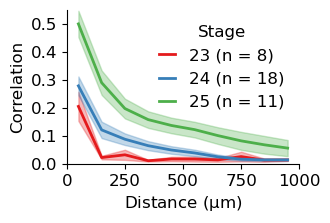

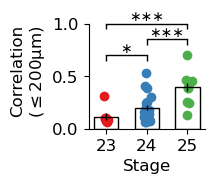

In [10]:
## Plot parameters
w = 0.05
bar_width = 0.6
x_buffer = 0.5
capsize = 10
linewidth = 1
fontsize=12

# Plot correlation vs distance
stages = [23,24,25]
grp = 'S1'
idx = (
          (df['Location']==grp)
          & (df['Stage'].isin(stages))
          & (df['EP age'] < 12)
      )
stages = np.sort(df[idx]['Stage'].unique().astype(int))
colors = cm.Set1(range(len(stages)))
stglbl = []

z = [] # for grouped values

fig,ax = plt.subplots(figsize=(3,2))

fig1,ax1 = plt.subplots(figsize=(1.5,1.5))

# Loop stages
for j,(stg,c) in enumerate(zip(stages,colors)):
    idx = (
              (df['Location']==grp)
              & (df['Stage']==stg)
              & (df['EP age'] < 12)
          )
    dunnart_ID = df[idx]['ID']
    idx = np.where(idx)
    bins = np.linspace(0,1000,11)
    y = np.zeros((len(idx[0]),bins.shape[0]-1))
    
    # Loop over recordings
    for k,i in enumerate(idx[0]):
        x = dist.flatten()
        values = R[i].flatten()
        
        # Remove NaNs
        nan_index = np.isnan(values)
        values = values[~nan_index]
        x = x[~nan_index]
        
        # bin values
        y[k,:], __, __ = binned_statistic(
                             x,
                             values,
                             statistic='mean',
                             bins=bins
                         )
    
    # Loop over dunnarts and aggregate results from different
    # recordings (i.e. unique samples)
    y_agg = np.zeros((len(dunnart_ID.unique()),bins.shape[0]-1))
    ep_age = np.zeros(len(dunnart_ID.unique()))
    for ii,ID in enumerate(dunnart_ID.unique()):
        y_agg[ii,:] = y[dunnart_ID==ID,:].mean(axis=0)
        ep_age[ii] = df[df['ID']==ID]['EP age'].values[0]
    y = y_agg
    
    # Plot correlation vs distance
    err = sem(y,axis=0,nan_policy='omit')
    n_samp = y.shape[0]
    y_mean = np.nanmean(y,axis=0)
    bin_centres = (bins[:-1] + bins[1:])/2
    ax.fill_between(
           bin_centres,
           y_mean-err,
           y_mean+err,
           alpha=0.3,
           color=c
       )
    stglbl.append(
               ax.plot(
                      bin_centres,
                      y_mean,
                      color=c,
                      linewidth=2,
                      label=("{:g} ".format(stg)
                             + "(n = {:g})".format(n_samp)
                            )
                  )
           )
    ax.set_xlim([0,1000])
    ax.set_ylim([0,0.55])
    ax.set_yticks(np.arange(0,0.6,0.1))
    ax.tick_params(axis='both',labelsize=fontsize)
    ax.set_xlabel('Distance ($\mathrm{\mu m}$)',fontsize=fontsize)
    ax.set_ylabel('Correlation',fontsize=fontsize)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if j==2:
        hleg = ax.legend(
               loc='upper right',
#                bbox_to_anchor=(1.6, 0.5),
               frameon=False,
               handlelength=1,
               fontsize=fontsize
        )
        hleg.set_title('Stage',prop={'size':fontsize})
    
    # Plot correlation for distance less than 200um
    dist0 = 0
    dist1 = 2
    idx = (ep_age>=15).astype(int)
    x_scatter = np.ones_like(y[:,dist0:dist1].mean(axis=1))*(j+1)
    x_scatter += (np.random.randn(x_scatter.shape[0]))*w 
    ax1.scatter(
            x_scatter,
            y[:,dist0:dist1].mean(axis=1),
            edgecolor=None,
            facecolor=colors[j],
        )
    
    y_mean = y[:,dist0:dist1].flatten().mean()
    y_err = sem(y[:,dist0:dist1].flatten())
    ax1.bar(
            x=j+1,
            height=y_mean,
            yerr=y_err,
            width=bar_width,
            color='None',
            edgecolor=axcolor,
            ecolor=axcolor,
            linewidth=linewidth,
            error_kw={'linewidth':linewidth},
        )
    
    # Collect values for statistical testing
    z.append(y[:,dist0:dist1].flatten())

# Formatting
ax1.set_ylim(0,1.1)
ax1.set_xticks(range(1,4))
ax1.set_xticklabels([str(stg) for stg in stages])
ax1.set_xlabel('Stage',fontsize=fontsize)
ax1.set_ylabel(
    'Correlation\n($\leq 200 \mathrm{\mu m}$)',
    fontsize=fontsize
)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_bounds((0, 1))
ax1.tick_params(axis='both',labelsize=fontsize)

# Plot overlines and p-values
for i in range(2):
    _,pval = ranksums(z[i],z[i+1])
    plot_overline(
        ax=ax1,
        lims=[i+1,i+2],
        height = 0.7+i*0.15,
        text_offset=0,
        pval=pval,
        color=axcolor,
        print_as=pval_format,
    )
    
    
# Extra overline
stg=0
_,pval = ranksums(z[0],z[2])
# yline = np.nanmax(np.concatenate([z[0],z[1],(z[2])]))*(1.3)
yline = 1
plot_overline(
    ax=ax1,
    lims=[1,3],
    height = yline,
    text_offset=0,
    pval=pval,
    color=axcolor,
    font_size=10,
    print_as=pval_format,
)

fig.savefig(figpath / 'corr_vs_dist.pdf',bbox_inches='tight',pad_inches=0)
fig1.savefig(figpath / 'corr_vs_dist_bar.pdf',bbox_inches='tight',pad_inches=0)

<a id='networks'></a>
## Network analysis in somatosensory cortex for detecting neuronal ensembles
We defined neuronal ensembles as groups of ROIs with statistical dependence between their $\Delta F/F$ time series that has modular structure.

### Gaussian graphical modelling
We first use Gaussian graphical modelling to estimate statistical dependence between ROIs. Gaussian graphical models are an approach that can be used for estimating partial correlations between variables. Partial correlations can be understood as direct connections in the assumed underlying network model, as distinct from indirect connections which can also lead to correlations. Under the assumption that the underlying processes generating the data are Gaussian, the matrix of partial correlations is the matrix-inverse of the covariance matrix, known as the precision matrix. Computing the precision matrix directly from the covariance matrix is often unreliable for high dimensional data. Gaussian graphical models attempt to estimate the precision matrix under a sparsity constraint which can be numerically optimised by cross-validation or the Bayesian information criterion (See the [skggm website](https://skggm.github.io/skggm/tour) for a summary of these concepts and more information on the `skggm` package which we used in our analysis).

Note that in our code we use the terms *ensemble* and and *assembly* interchangeably.

### Optimising the sparsity contraint $\lambda$ using BIC
The critical free parameter is the sparsity contraint $\lambda$. The `skggm` package offers two primary methods for optimising $\lambda$: $k$-fold cross-validation (CV) and the extended Bayesian information criterion (EBIC). We have used the latter approach.

The "E" in EBIC refers to an additional sparsity parameter $\gamma$ which must be selected. EBIC reduces to the standard BIC when $\gamma=0$. It has been shown that $\gamma>0$ can improve accuracy where the dimensionality of the data is of similar size to the length. This is not the case for our data, so we set $\gamma=0$ and use BIC to optimise $\lambda$ and therefore avoid extra parameterisation.

The optimisation process is computationally costly so we have implemented a telescopic grid search (logarithmic) with 20 increments at each iteration and an initial grid range of $0.01\leq \lambda\leq 1$. The search stops when $\lambda$ has been identified to a tolerance of $10^{-3}$ or after a maximum of 10 iterations.

For a small number of recordings there are ROIs for which the $\Delta F/F$ time series were set to zero because of low baseline activity. This causes the alorithm to converge on erroneous solutions. To alleviate this issue we add very low level white Gaussian noise to these time series.

To avoid possible bias caused by varying recording length (i.e., effects of possible long-term non-stationarity), all recordings are truncated to 10 minutes (1300 samples). There is a single dunnart with less than 10 minutes of data, but this single sample is unlikely to impact the overall findings.

In [11]:
file_name = scratchpath / 'ggm.npy'

if not os.path.exists(file_name):
    # Compute the binarised activity data and save
    print(
        "Intermediate files do not exist. "
        "Computing and saving data...",
        flush=True,
    )
    
    GGM = [] # List for fit GGM models
    n_max = 1300 # truncate time to this index
    
    # Loop over recordings
    for d,dff in tqdm(enumerate(F)):
        if df.iloc[d]['Location'] in ['S1','V1']:
            X = dff.reshape(dff.shape[0],dff.shape[1]*dff.shape[2])
            X = X[:n_max,:]
            lam,mdl = GridSearchBIC(
                         X,
                         lims=[1e-2,1],
                         n_val=20,
                         max_iter=10,
                         tol=1e-3,
                         add_noise=True,
                         noise_std=1e-6,
                         fit_tol=1e-6,
                         fit_max_iter=1000,
                         verbose=0,
                      )
        else:
            mdl=None
        GGM.append(mdl)
    
    # Save data
    np.save(file_name,GGM,allow_pickle=True)
    print("Data saved")
    
else:
    # Load the GGM model fit data
    print(
         "Intermediate files exist. "
         "Loading data...",
         flush=True,
    )
    GGM = np.load(file_name,allow_pickle=True)
    GGM = [ggm for ggm in GGM]
    print("Data loaded\n")

Intermediate files exist. Loading data...
Data loaded



<a id='community'></a>
### Estimating neuronal ensembles by community detection
Partial correlations $\rho_{i,j} \in [-1,1]$ between ROI pair ${i,j}$ can be computed from the precision matrix as:
$$\rho_{i,j} = -\frac{\Theta_{i,j}}{\sqrt{\Theta_{i,i}\Theta_{j,j}}}$$

Using Louvain community detection, as implemented [here](https://github.com/taynaud/python-louvain), we can identify ensembles directly from the weights of the partial correlation matrix. Given that we are interested in ensembles of co-active ROIs, we discard negative partial correlations.

<a id='netvis'></a>
### Example network visualisation
As an example, below we have plotted community detection results for dunnart 20170307-d3 as:

1. Ensemble membership by colour spatially arranged to match the ROIs over the imaging area.
1. A force-directed graph visualisation of the network where colours show ensemble membership.
1. A rendering of the partial correlation matrix organised by ensemble membership.

In [12]:
# Dunnart ID to plot for example figures
d=2
print(
    'Dunnart ID: '
    + df['Matlab ID'][d]
)

# Construct functional connectivity network
mdl = deepcopy(GGM[d])
P = partial_corr_from_precision(mdl.precision_)
G = nx.from_numpy_array(P*(P>0))

# Get giant component (we compute all our network measures on this)
Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
G = G.subgraph(Gcc[0])

# Detect communities
p = community_louvain.best_partition(G,random_state=2)

# Re-order colour map for easier visualisation
cmap = cm.tab20(range(8))
jdx = [0, 6, 2, 5, 1, 4, 7, 3] # Permuting the colour order to
                               # avoid similar neighboring colours
cmap = cmap[jdx,:]

# Create list of communities
c = list_communities(p)

Dunnart ID: 20170307-d3


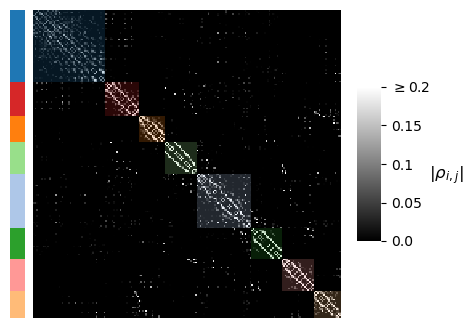

In [13]:
# Adjacency visualisation
fig, ax = adjacency_communities(
              G,
              c,
              cmap=cmap,
              vmax=0.2,
              zlabel=r"|$\rho_{i,j}$|",
          )
fig.savefig(
    figpath / 'example_partial_correlation.pdf',
    bbox_inches='tight'
)

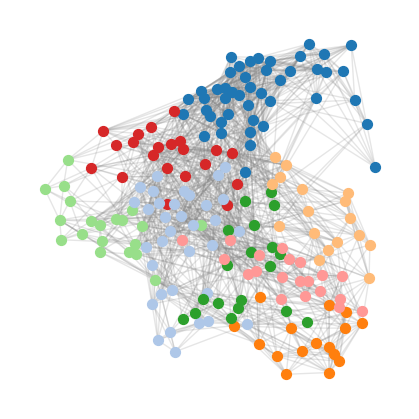

In [14]:
# Network visualisation
fig, ax = network_embedding(G,c,cmap=cmap,seed=11)
fig.savefig(
    figpath / 'example_network.pdf',
    bbox_inches='tight',
    transparent=True,
)   

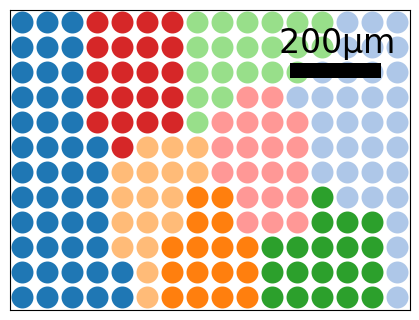

In [15]:
# Clustering plot
scale = bin_edge_len*df['Pixel Size '][0]
fig, ax = community_map(
    c,
    pos,
    cmap=cmap,
    node_size=250,
    scale_bar=True,
    scale_bar_length=200,
    scale_bar_pos=(0.7,0.8),
    scale_bar_width=0.05,
    scale=scale,
    scale_bar_units='$\mathrm{\mu m}$',
    fontsize=24,
)
fig.savefig(
    figpath / 'example_assemblies.pdf',
    bbox_inches='tight',
    transparent=True,
    pad_inches=0
)

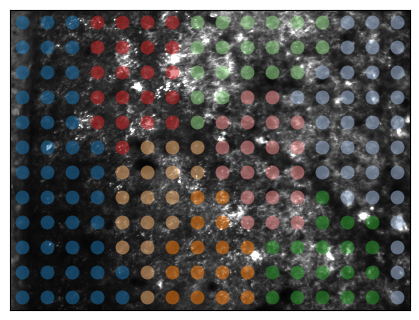

In [16]:
# Clustering plot overlay
f = df['fpath'][d]
# Load imaging data
if f[-3:] =='lsm':
    im = tf.imread(f).squeeze()
else:
    im = cz.imread(f).squeeze()
# Truncate
im = im[:n_max,:,:]
im = im.mean(axis=0)
scale = bin_edge_len*df['Pixel Size '][0]
fig, ax = community_map(
    c,
    pos,
    cmap=cmap,
    img=im,
    node_size=100,
    node_alpha=0.5,
    vmin=0,
    vmax=31,
    scale_bar=False
)
fig.savefig(
    figpath / 'example_assemblies_overlay.pdf',
    bbox_inches='tight',
    transparent=True,
    pad_inches=0,
)

<a id='netvisdev'></a>
### Network visualisation over development

Dunnart ID: 20190306-d2
Dunnart ID: 20191116-d3
Dunnart ID: 20190716-d2


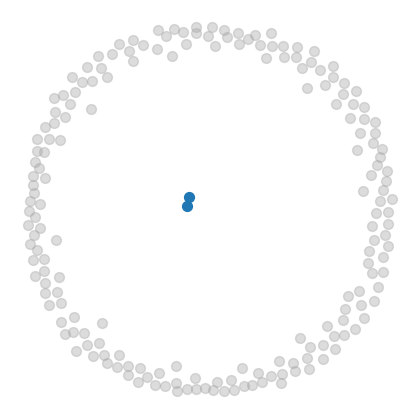

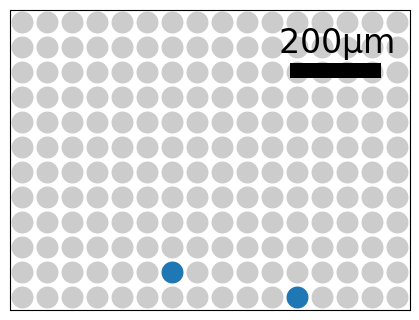

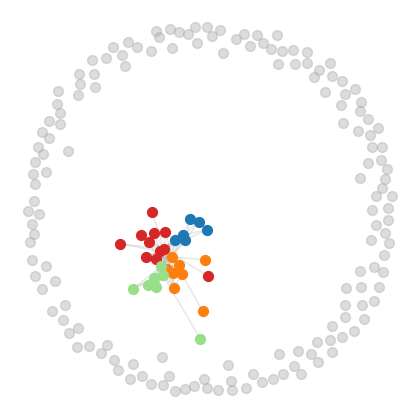

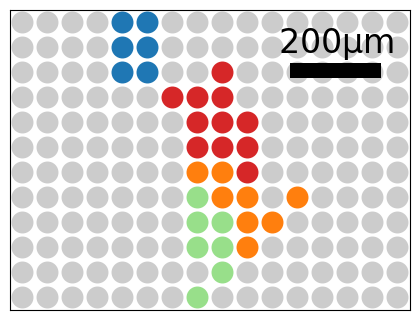

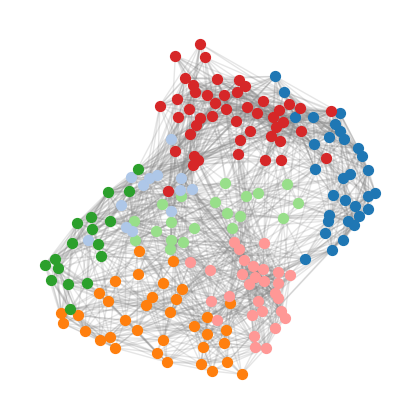

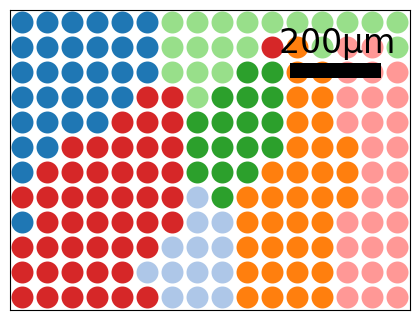

In [17]:
IDs = [
          '20190306-d2',
          '20191116-d3',
          '20190716-d2',
]

stages = [23,24,25]

for dunnart_id,stg in zip(IDs,stages):
    d = df[df['Matlab ID']==dunnart_id].index.values[0]
    print(
        'Dunnart ID: '
        + df['Matlab ID'][d]
    )

    # Construct functional connectivity network
    mdl = deepcopy(GGM[d])
    P = partial_corr_from_precision(mdl.precision_)
    G = nx.from_numpy_array(P*(P>0))

    # Detect communities
    p = community_louvain.best_partition(G,random_state=100)


    # Create list of communities
    c = list_communities(p)
    
    # Network visualisation
    fig, ax= network_embedding(G,c,cmap=cmap,othernode_alpha=0.4,seed=16)
    fig.savefig(
        figpath / ('ggm_networks_'+ grp +'_' + str(stg) +'.pdf'),
        bbox_inches='tight',
        transparent=True,
        pad_inches=0
    )

    # Clustering plot
    scale = bin_edge_len*df['Pixel Size '][0]
    fig, ax = community_map(
        c,
        pos,
        cmap=cmap,
        node_size=250,
        othernode_alpha=0.4,
        scale_bar=True,
        scale_bar_length=200,
        scale_bar_pos=(0.7,0.8),
        scale_bar_width=0.05,
        scale=scale,
        scale_bar_units='$\mathrm{\mu m}$',
        fontsize=24,
    )
    
    fig.savefig(
        figpath / ('ggm_assemblies_'+ grp +'_' + str(stg) +'.pdf'),
        bbox_inches='tight',
        transparent=True,
        pad_inches=0
    )

<a id='netprops'></a>
### Quantifying ensemble and network properties from functional connectivity
Ensemble properties were computed on the full network, excluding communities that only contain single ROIs. Other measures (node strength and relative shortest path length) were computed on the giant component of the network (the giant component differs from the full network in only 7 out of 67 recordings, and in these cases differs only by the exclusion of 10 nodes at most).

Path length measures were computed based on the inverse of edge weight (i.e., less correlation means greater distance). See `edge_weights_inverse`.

The Louvain community detection algorithm iterates over nodes. Therefore it is sensitive to node ordering. To ensure that our results were robust, we ran the algorithm 100 times with randomised node ordering.

In [18]:
file_name = scratchpath / 'NETWORK_PROPS.npy'

if not os.path.exists(file_name):
    # Compute functional network properties from partial correlations
    NETWORK_PROPS = []

    # Number of community estimates to perform with different random
    # seeds
    n_estimates = 100

    for d in tqdm(range(len(GGM))):
        # Get network from precision matrix
        mdl = deepcopy(GGM[d])
        P = partial_corr_from_precision(mdl.precision_)
        G = nx.from_numpy_array(P*(P>0))

        # Remove disconnected nodes (define that communities must
        # include more than one node)
        G = G.subgraph(
                [
                    item[0]
                    for item
                    in list(G.degree)
                    if item[1]>0
                ]
            )

        # If node degree is zero for all nodes
        if G:
            # Assembly analysis on the full network
            num_assemblies = np.full((n_estimates,1),np.nan)
            assembly_size = np.full((n_estimates,1),np.nan)
            modularity = np.full((n_estimates,1),np.nan)
            for i in range(n_estimates):
                # Assembly detection
                p = community_louvain.best_partition(G,randomize=True)
                c = list_communities(p)

                # Number of assemblies
                num_assemblies[i] = len(c)

                # Mean assembly size
                assembly_size[i] = np.mean([len(comm) for comm in c])

                # If G has edges then measure quality of partition
                if G.edges:
                    # Compute modularity
                    modularity[i] = community_louvain.modularity(p,G)

            # Get giant component
            Gcc = sorted(
                      nx.connected_components(G),
                      key=len,
                      reverse=True,
                  )
            G = G.subgraph(Gcc[0])
            num_nodes_gc = G.number_of_nodes()

            # Mean node strength
            node_strength = np.mean(
                                       [
                                           strength[1]
                                           for strength
                                           in G.degree(weight='weight')
                                       ]
                            )

            # Mean shortest path length
            G = edge_weights_inverse(G)
            spl = nx.average_shortest_path_length(
                      G,
                      weight='inv_weight',
                      method='dijkstra'
                  )

        else:
            # If node degree is zero for all nodes (no edges in
            # network)
            num_nodes_gc = 0
            node_strength = np.nan
            spl = np.nan
            num_assemblies = 0
            assembly_size = np.nan
            modularity = np.nan

        # Store output
        results_dict = {
                           'num_nodes_gc' : num_nodes_gc,
                           'node_strength' : node_strength,
                           'spl' : spl,
                           'num_assemblies' : np.nanmean(
                                                  num_assemblies
                                              ),
                           'assembly_size' : np.nanmean(assembly_size),
                           'modularity': np.nanmean(modularity),
                       }
        NETWORK_PROPS.append(results_dict)
    
    # Save data
    np.save(file_name,NETWORK_PROPS,allow_pickle=True)
    print("Data saved")

else:
    # Load the network properties
    print(
         "Intermediate files exist. "
         "Loading data...",
         flush=True,
    )
    NETWORK_PROPS = np.load(file_name,allow_pickle=True)
    NETWORK_PROPS = [network_props for network_props in NETWORK_PROPS]
    print("Data loaded\n")

Intermediate files exist. Loading data...
Data loaded



<a id='netplots'></a>
### Plotting network analysis results

In [19]:
# Merge functional connectivity results into dataframe
for d,network_props in enumerate(NETWORK_PROPS):
    df.at[d,'ggm_num_assemblies'] = network_props['num_assemblies']
    df.at[d,'ggm_assembly_size'] = network_props['assembly_size']
    df.at[d,'ggm_modularity'] = network_props['modularity']
    df.at[d,'ggm_num_nodes_gc'] = network_props['num_nodes_gc']
    df.at[d,'ggm_node_strength'] = network_props['node_strength']
    spl = np.float64(network_props['spl'])
    num_nodes_gc = np.float64(network_props['num_nodes_gc'])
    df.at[d,'ggm_relative_spl'] = spl/num_nodes_gc

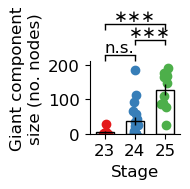

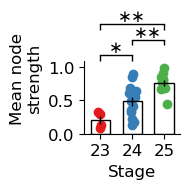

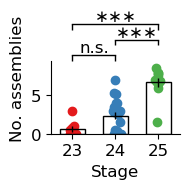

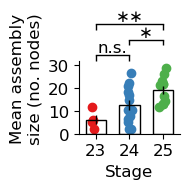

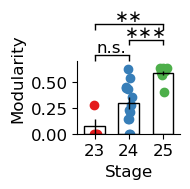

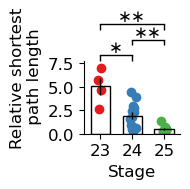

In [20]:
variables = [
                'ggm_num_nodes_gc',
                'ggm_node_strength',
                'ggm_num_assemblies',
                'ggm_assembly_size',
                'ggm_modularity',
                'ggm_relative_spl'
            ]
labels = [
             'Giant component\nsize (no. nodes)',
             'Mean node\nstrength',
             'No. assemblies',
             'Mean assembly\nsize (no. nodes)',
             'Modularity',
             'Relative shortest\n path length'
         ]
ylim = [
           200,
           1.2,
           10,
           40,
           0.8,
           0.25,
           7.5
       ]


stages = [23,24,25]

for i,(v,lbl) in enumerate(zip(variables,labels)):
    # Filter dataframe
    grp = 'S1'
    df_filtered = df[(df['Location']==grp) & (df['Stage'].isin(stages)) & (df['EP age']<12)] 
    df_filtered = df_filtered.groupby('ID').agg({'Stage':'first','movieLength':'first',v:np.nanmean})
    
    # Remove NaNs else they propogate to the statistical test
    # Note: important to realise that NaNs indicate that a given measure
    # is not defined for the recording in question - for example modularity
    # cannot be measured if there are no communities.
    df_filtered.dropna(inplace=True)
    
    # Scatter plot
    y = df_filtered[v]
    x = df_filtered['Stage']
    fig,ax = bar_plot3(
                 x,
                 y,
                 figsize=(2,2),
                 xlabel='Stage',
                 ylabel=lbl,
                 pval_format='asterisk',
                 fontsize=12,
             )
    fig.savefig(figpath / (v + '.pdf'),bbox_inches='tight',pad_inches=0)

## Analysing wave-like activity in visual cortex

<a id='wavetrack'></a>
### Wave tracking
We apply a statistical framework to extract spatio-temporal events from the data automatically as follows. First we, consider contiguous volumes of activity based on the binarised neural activity data `B` (i.e. connected components across  x,y and time). Then we ask how likely is it that these volumes occurred by chance given the data for a particular recording? We test this with respect to the following properties:

1. The duration of the volume in the time dimension.
1. The total number of activations in the volume.
1. The number of participating ROIs, because for the activity to be wave-like there must be coordinated activity between multiple ROIs.

For each given event, these properties must be greater than the $95^{\mathrm{th}}$ percentile as expected by chance under the assumption that the activity in each ROI is independent of all other ROIs. This is achieved by de-correlating the activity between ROIs using a circular shuffle.

We use a similar procedure to filter the data based on the number of spatially contiguous co-activations at any given time. For example, consider the scenario where two temporally adjacent waves are spuriously joined together by a single noisy activation. We use circular shuffle surrogates to determine the distribution of spatially contiguous co-activations that occur by chance. We then split or truncate wave events based on the significance threshold as above.

See `label_cc` and `wave_peak_tracker` functions for implementation.

In [21]:
file_name = scratchpath / 'CC.npy'

if not os.path.exists(file_name):
    # Compute the binarised activity data and save
    print(
        "Intermediate files do not exist. "
        "Computing and saving data...",
        flush=True,
    )
    
    CC = []
    # Loop over recordings
    for b in tqdm(B):
        results_dict = label_cc(b,n_shuffles=1000,alpha=0.05)
        CC.append(results_dict)
    
    # Save data
    np.save(file_name,CC,allow_pickle=True)
    print("Data saved")
    
else:
    # Load the CC data
    print(
         "Intermediate files exist. "
         "Loading data...",
         flush=True,
    )
    CC = np.load(file_name,allow_pickle=True)
    CC = [cc for cc in CC]
    print("Data loaded\n")

Intermediate files exist. Loading data...
Data loaded



In [22]:
file_name = scratchpath / 'WAVES.npy'

if not os.path.exists(file_name):
    # Compute the binarised activity data and save
    print(
        "Intermediate files do not exist. "
        "Computing and saving data...",
        flush=True,
    )
    
    WAVES = []
    # Loop over recordings
    for dff,cc in tqdm(zip(F,CC)):
        labels = cc['labels']
        ccs = cc['cc']
        min_duration = cc['min_duration']
        min_total_size = cc['min_total_size']
        min_voxels = cc['min_voxels']
        waves = wave_peak_tracker(
                    dff,
                    labels,
                    ccs,
                    min_duration,
                    min_total_size,
                    min_voxels,
                    max_speed=4,
                    generate_movie=False,
                )
        WAVES.append(waves)
    
    # Save data
    np.save(file_name,np.array(WAVES,dtype='object'),allow_pickle=True)
    print("Data saved")
    
else:
    # Load the waves data
    print(
         "Intermediate files exist. "
         "Loading data...",
         flush=True,
    )
    WAVES = np.load(file_name,allow_pickle=True)
    WAVES = [waves for waves in WAVES]
    print("Data loaded\n")

Intermediate files exist. Loading data...
Data loaded



In [23]:
# Compute wave measures and merge into datafame
for d,waves in enumerate(WAVES):
    dur = [] # seconds
    dist = [] # um
    size = [] # number of activations
    area = [] # number of participating ROIs
    speed = [] # um/s
    for w in waves:
        dur.append(
            w['x'].shape[0]/df['frameRate'][d]
        )
        
        dist.append(
            trajectory_length(w['x'])
            * bin_edge_len
            * df['Pixel Size '][d]
        )
        
        size.append(
            w['size'].sum()
        )
        
        area.append(
            w['area']
        )
        
        speed.append(
            trajectory_length(w['x'])
            * bin_edge_len
            * df['Pixel Size '][d]
            / (w['x'].shape[0]/df['frameRate'][d])
        )
    
    df.at[d,'wave_frequency'] = (
                                    len(waves)
                                    / df['movieLength'][d]
                                    * df['frameRate'][d]
                                )
    df.at[d,'wave_duration'] = np.mean(dur)
    df.at[d,'wave_distance'] = np.mean(dist)
    df.at[d,'wave_size'] = np.mean(size)
    df.at[d,'wave_area'] = np.mean(area)
    df.at[d,'wave_speed'] = np.mean(speed)


<a id='waveplots'></a>
### Plotting wave properties

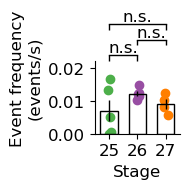

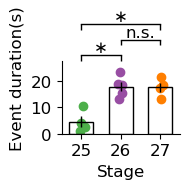

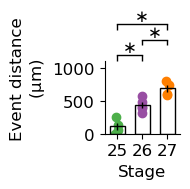

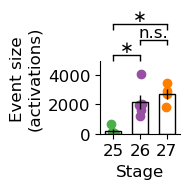

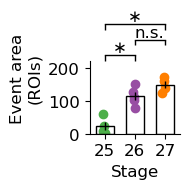

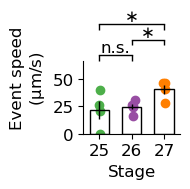

In [24]:
# Plot wave measures
variables = [
                'wave_frequency',
                'wave_duration',
                'wave_distance',
                'wave_size',
                'wave_area',
                'wave_speed'
            ]
labels = [
             'Event frequency\n(events/s)',
             'Event duration(s)',
             'Event distance\n($\mathrm{\mu m}$)',
             'Event size\n(activations)',
             'Event area\n(ROIs)',
             'Event speed\n($\mathrm{\mu m/s}$)',

         ]
ymax = [
           0.02,
           25,
           1000,
           4500,
           200,
           60,
       ]


stages = [25,26,27]
cmap = cm.Set1(range(5))[2:,:]

for i,(v,lbl) in enumerate(zip(variables,labels)):
    # Filter dataframe
    grp = 'V1'
    df_filtered = df[(df['Location']==grp) & (df['Stage'].isin(stages)) & (df['EP age']>12)] 
    df_filtered = df_filtered.groupby('ID').agg({'Stage':'first','movieLength':'first',v:np.nanmean})
    
    # Remove NaNs else they propogate to the statistical test
    df_filtered.dropna(inplace=True)
    
    # Scatter plot
    y = df_filtered[v]
    x = df_filtered['Stage']
    fig,ax = bar_plot3(
                 x,
                 y,
                 bar_width=0.6,
                 cmap=cmap,
                 figsize=(2,2),
                 xlabel='Stage',
                 ylabel=lbl,
                 ymax=ymax[i],
                 pval_format='asterisk',
                 fontsize=12,
             )
    fig.savefig(figpath / (v + '.pdf'),bbox_inches='tight',pad_inches=0)

<a id='wavedir'></a>
### Plotting wave direction and computing directional statistics

P-values from statistical tests for non-uniform distribution on the circle:




,Rayleigh,Rayleigh bimodal,Omnibus,Rao spacing,Hermans-Rasson
25,0.060678,0.508379,0.10635415516836132,0.1,0.062
26,0.00002,0.032996,0.00011242672424368894,0.05,0.0
27,0.611353,0.445784,0.641426998902202,NaN,0.665


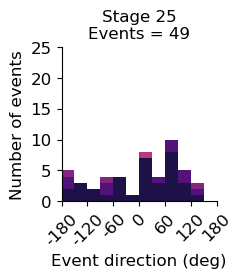

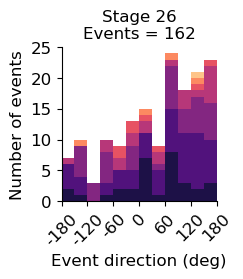

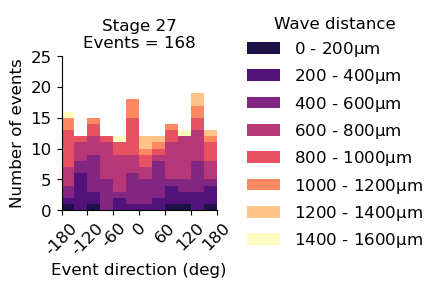

In [25]:
# Create dataframe for output of statistical tests for directionality
directionality = pd.DataFrame(
                     index=stages,
                     columns=[
                                 'Rayleigh',
                                 'Rayleigh bimodal',
                                 'Omnibus',
                                 'Rao spacing',
                                 'Hermans-Rasson'
                             ],
                 )

# Statistical testing and stacked histogram plots
stages = [25,26,27]
for stage in stages:
    idx = (
              (df['Location']=='V1')
              & (df['Stage']==stage)
              & (df['EP age']>12)
          )
    dist = []
    theta = []
    
    for d in np.where(idx)[0]:
        waves = WAVES[d]
        dist += [
                    (
                        trajectory_length(w['x'])
                        * bin_edge_len
                        * df['Pixel Size '][d]
                    )
                    for w
                    in waves
                ]
        theta += [
                     mean_trajectory_angle(w['x'])
                     for w
                     in waves
                 ]
    
    # Statistical tests
    theta = np.array(theta)
    ## Tests for directionality
    # Rayleigh
    pval,_ = rayleigh(theta)
    directionality.at[stage,'Rayleigh'] = pval
    # Rayleigh symmetric bi-modal
    pval,_ = rayleigh((2*theta)%(2*np.pi))
    directionality.at[stage,'Rayleigh bimodal'] = pval
    # Omnibus
    pval,_ = omnibus(theta)
    directionality.at[stage,'Omnibus'] = pval
    # Rao spacing
    pval,_,_ = raospacing(theta)
    if pval==0.5:
        pval=np.nan
    directionality.at[stage,'Rao spacing'] = pval
    # Herman-Rassons
    pval,_ = hermans_rasson(theta,N=1000)
    directionality.at[stage,'Hermans-Rasson'] = pval
    
    # Plot stacked histograms
    theta = np.rad2deg(theta)
    # Specify bin widths
    bins_theta = np.linspace(-180,180,13) # 30 degree bin width
    bins_dist = np.linspace(0,1600,9) # 400um bin width
    if stage==27:
        legend=True
    else:
        legend=False
    fig,ax = stacked_histogram(
                 theta,
                 dist,
                 xbins=bins_theta,
                 zbins=bins_dist,
                 polar=False,
                 legend=legend,
                 figsize=(2,2),
                 ylim=(0,25),
                 xlabel="Number of events",
                 ylabel="Event direction (deg)",
                 zlabel="Wave distance",
                 zunits=r"$\mathrm{\mu m}$",
                 fontsize=12,
             )
    # Set title
    pltstr = (
                 f'Stage {stage}'
                 + f'\nEvents = {len(theta)}'
             )
    ax.set_title(pltstr,fontsize=12)
    
    # Save figure
    fig.savefig(figpath / ('wave_histogram_'+ grp +'_' + str(stage) +'.pdf'),
                        bbox_inches='tight')

# Print output of statistical tests
print('P-values from statistical tests for non-uniform distribution on the circle:\n\n')
display.display(directionality)

<a id='wavetraj'></a>
### Plotting wave trajectories

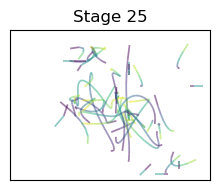

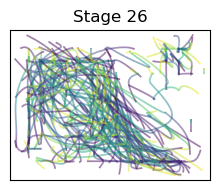

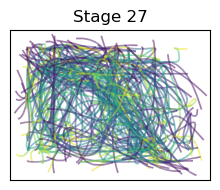

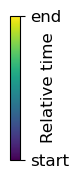

In [26]:
##### Wave trajectory plots
stages = [25,26,27]
for stage in stages:
    idx = (
              (df['Location']=='V1')
              & (df['Stage']==stage)
              & (df['EP age']>12)
          )
    x = []
    
    for d in np.where(idx)[0]:
        waves = WAVES[d]
        x += [w['x'] for w in waves]
        
    # Wave trajectory plots
    title_str = f'Stage {stage}'
    scale_bar = False
    if stage==27:
        timescale_bar = True
    else:
        timescale_bar = False
    fig, ax, fig_ts, ax_ts = wave_trajectories(
                                 x,
                                 timescale_bar,
                                 figsize=(2,1.5),
                                 linewidth=1.25,
                                 linealpha=0.5,
                                 xlim = (0,dff.shape[2]),
                                 ylim = (0,dff.shape[1]),
                                 title = title_str,
                                 fontsize = 12,
                                 scale_bar=scale_bar,
                                 scale_bar_length=200,
                                 scale_bar_pos=(0.7,0.8),
                                 scale_bar_width=0.05,
                                 scale=scale,
                                 scale_bar_units='$\mathrm{\mu m}$',
                            )
    fig.savefig(
        figpath / ('waves' + 'V1' +'_' + str(stage) +'.pdf'),
        bbox_inches='tight',
    )
    if fig_ts:
        fig_ts.savefig(
            figpath / 'waves_colour_bar.pdf',
            bbox_inches='tight',
        )

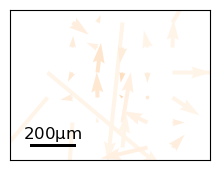

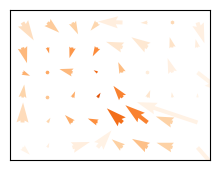

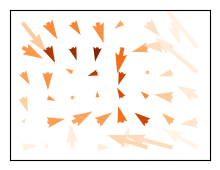

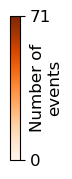

In [27]:
# Vector field plots
stages = [25,26,27]
VEC = []
for stage in stages:
    # Get wave trajecoroies for stage
    idx = (
              (df['Location']=='V1')
              & (df['Stage']==stage)
              & (df['EP age']>12)
          )
    x = []
    for d in np.where(idx)[0]:
        waves = WAVES[d]
        x += [w['x'] for w in waves]
    
    # Reformat wave trajectories and compute velocity vectors
    X = []
    Y = []
    K = []
    U = []
    V = []
    k = 0
    for xs in x:
        X += list(xs[:-1,1])
        Y += list(xs[:-1,0])
        K += list(np.ones_like(xs[:-1,1])*k)
        k += 1
        z = np.diff(xs,1,axis=0)
        U += list(z[:,1]) 
        V += list(z[:,0])
    X = np.array(X)
    Y = np.array(Y)
    K = np.array(K,dtype=int)
    U = np.array(U)
    V = np.array(V)
    
    # Get vector fields
    nx = 8 # for this analysis we use an 8x6 grid for binning
    ny = 6
    xbins = np.linspace(0,dff.shape[2],nx+1)
    ybins = np.linspace(0,dff.shape[1],ny+1)
    X,Y,U,V,C = vector_field(X,Y,K,U,V,xbins=xbins,ybins=ybins)
    VEC.append([X,Y,U,V,C])
    
# Compute colour map for plots (max over all stages)
cmax = np.hstack([item[-1].flatten() for item in VEC]).max()
norm = mpl.colors.Normalize(vmin=0,vmax=cmax)

# Plot vector fields
for i,stage in enumerate(stages):
    X,Y,U,V,C = VEC[i]
    if stage==25:
        scale_bar=True
    else:
        scale_bar=False
    if stage==27:
        histscale_bar = True
    else:
        histscale_bar = False
    fig, ax, fig_hs, ax_hs = vector_field_plot(
                  X,
                  Y,
                  U,
                  V,
                  C,
                  histscale_bar = histscale_bar,
                  norm=norm,
                  xlim=(0,dff.shape[2]),
                  ylim=(-dff.shape[1],0),
                  fontsize = 12,
                  scale_bar=scale_bar,
                  scale_bar_length=200,
                  scale_bar_pos=(0.1,0.1),
                  scale_bar_width=0.02,
                  scale=scale,
                  scale_bar_units='$\mathrm{\mu m}$',
                  histscale_labelpad=-15,
              )
    fig.savefig(
        figpath / ('waves_vector_field'+ 'V1' +'_' + str(stage) +'.pdf'),
        bbox_inches='tight',
    )
    
    if fig_hs:
        fig_hs.savefig(
            figpath / 'waves_vector_colour_bar.pdf',
            bbox_inches='tight',
        )

## Comparing activity features between visual and somatosensory cortex

<a id='regionlda'></a>
### MANOVA and LDA with reduced variable set from LASSO regression
To compare activity between late stage recordings in visual and somatosensory cortex we apply a MANOVA test and LDA on a reduced set of variables. We use the reduced set of variables to avoid overfitting and finding spurious differences. To select the reduced set of variables we use LASSO regression with cross-validation to identify the features that discriminate between the groups more often than not (median) when regularisation is applied.

In [28]:
# Specify variables (all those included in main figs)
labels = ['ID','Location']
variables = [
                'wave_duration',
                'wave_size',
                'wave_area',
                'wave_distance',
                'ggm_num_nodes_gc',
                'ggm_node_strength',
                'ggm_num_assemblies',
                'ggm_assembly_size',
                'ggm_modularity',
            ]

# Specify plot labels for variables
y_labels = [
               'Event duration',
               'Event size',
               'Event area',
               'Event distance',
               'Giant component size',
               'Mean node strength',
               'No. assemblies',
               'Mean assembly size',
               'Modularity',
            ]

# First grab all S1 for EP age==16
stages = [26,27]
df1 = df[
            (df['Location']=='S1')
            & (df['Stage'].isin(stages))
            & (df['EP age']>12)
        ][labels+variables]
# Then grab all V1 stage 27 for EP age==16
df2 = df[
            (df['Location']=='V1')
            & (df['Stage'].isin(stages))
            & (df['EP age']>12)
        ][labels+variables]
# Then concatenate and clean
df3 = pd.concat([df1,df2])
df3.fillna(value=0,inplace=True)

# Aggregate over animals
agg_dict = {v:np.nanmean for v in variables}
agg_dict['Location'] = 'first'
df3 = df3.groupby(['ID','Location']).agg(agg_dict)

# Reformat for sklearn and preprocess (0 mean, unit variance)
X = df3[variables]
X = X.apply(zscore)
X = X.reset_index().drop(columns=['ID'])

# Encode labels
y = X.Location.values
y = y.reshape(-1,)
le = preprocessing.LabelEncoder()
y = le.fit_transform(y)

500it [00:56,  8.77it/s]


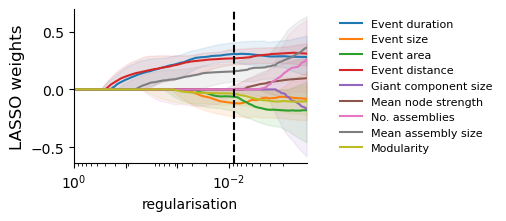

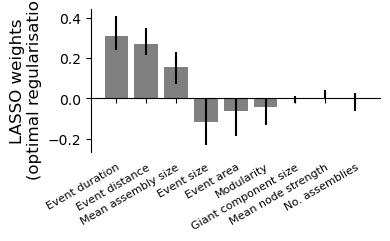

In [29]:
# LASSO classifier to get regularisation
alphas = np.logspace(-3,1,401)
cv = RepeatedKFold(
         n_splits=5,
         n_repeats=100,
     )

mdl = LassoCV(
          alphas=alphas,
          max_iter=int(1e6),
          tol=1e-6,
          cv=cv
      )
mdl.fit(X[variables],y)
alpha_fit = mdl.alpha_

# Regularisation path
coefs = np.zeros((len(variables),alphas.size,500))
for k,(train_index,_) in tqdm(enumerate(cv.split(X))):
    for i,alpha in enumerate(alphas):
        mdl = Lasso(
                  alpha=alpha,
                  max_iter=int(1e6),
                  tol=1e-6,
              )
        mdl.fit(X[variables].values[train_index],y[train_index])
        coefs[:,i,k] = mdl.coef_
    
color = cm.tab10(range(9))  
fig,ax = plt.subplots(figsize=(3,2))
for i,label in enumerate(y_labels):
    ax.fill_between(
        alphas,
        np.percentile(coefs[i,:,:50],2.5,axis=1),
        np.percentile(coefs[i,:,:50],97.5,axis=1),
        color=color[i,:],
        alpha=0.1,
    )
for i,label in enumerate(y_labels):
    ax.plot(
        alphas,
        np.median(coefs[i,:,:50],axis=1),
        color=color[i,:],
        label=label
    )
ax.axvline(alpha_fit,linestyle="--",color='k')
ax.set_xscale('log')
ax.set_xlim((1,1e-3))
xticks = np.logspace(-2,0,4)
ax.set_xticks(xticks)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel('LASSO weights',fontsize=fontsize)
ax.set_xlabel('regularisation')
hleg = ax.legend(
                   loc='center left',
                   bbox_to_anchor=(1.1,0.5),
                   frameon=False,
                   fontsize=8
               )
fig.savefig(
    figpath / 'lasso_S1vsV1_regularisation.pdf',
    bbox_inches='tight'
)

# Components
fig,ax = plt.subplots(figsize=(4,2.5),tight_layout=True)
alpha_idx = np.where(alphas==alpha_fit)[0]
coef = np.median(
    coefs[:,alpha_idx,:50],
    axis=2).flatten()
idx = np.argsort(-np.abs(coef))
x = np.arange(coef.shape[0])
ye_upper = np.percentile(coefs[:,alpha_idx,:50],97.5,axis=2).flatten()
ye_lower = np.percentile(coefs[:,alpha_idx,:50],2.5,axis=2).flatten()
err = np.abs(np.stack([coef-ye_lower,ye_upper-coef]))
h = ax.bar(x,height=coef[idx],yerr=err[:,idx],
              color='Gray',edgecolor='none')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_position('zero')
ax.set_ylabel('LASSO weights\n(optimal regularisation)',fontsize=fontsize)
ax.set_xticks(x)
ax.set_xticklabels(
       np.array(y_labels)[idx],
       rotation=30,
       ha='right',
       rotation_mode="anchor",
       fontdict={'fontsize':8},
   )
ax.tick_params(axis='x', which='major', pad=42)
fig.savefig(
    figpath / 'lasso_S1vsV1_weights.pdf',
    bbox_inches='tight'
)

                  Multivariate linear model
                                                             
-------------------------------------------------------------
        Intercept        Value  Num DF  Den DF F Value Pr > F
-------------------------------------------------------------
           Wilks' lambda 0.1486 6.0000 12.0000 11.4562 0.0002
          Pillai's trace 0.8514 6.0000 12.0000 11.4562 0.0002
  Hotelling-Lawley trace 5.7281 6.0000 12.0000 11.4562 0.0002
     Roy's greatest root 5.7281 6.0000 12.0000 11.4562 0.0002
-------------------------------------------------------------
                                                             
-------------------------------------------------------------
        Location         Value  Num DF  Den DF F Value Pr > F
-------------------------------------------------------------
          Wilks' lambda  0.0764 6.0000 12.0000 24.1853 0.0000
         Pillai's trace  0.9236 6.0000 12.0000 24.1853 0.0000
 Hotelling-Lawley trace 12

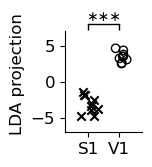

In [30]:
# LDA between S1 and V1 at late stages
w = 0.15
bar_width = 0.6
linewidth = 1
colors = cm.Set1(range(5))[2:]
fontsize = 12
figsize = (1,1.5)

# Variable subset
variables_reduced = [
    'wave_distance',
    'wave_duration',
    'ggm_assembly_size',
    'wave_size',
    'wave_area',
    'ggm_modularity',
]

# MANOVA
formula = (
    ' + '.join(variables_reduced)
    + ' ~ Location'
)
mv = MANOVA.from_formula(formula,data=X)
manova_test = mv.mv_test()
print(manova_test)
wilks_pval = (
                 manova_test
                 .results['Location']['stat']
                 .loc["Wilks' lambda"]["Pr > F"]
             )

# LDA
mdl = LinearDiscriminantAnalysis(
          n_components=1,
          tol=1e-6,
      )
z = mdl.fit_transform(X[variables_reduced],y)

# Plot LDA scores
fig,ax = plt.subplots(figsize=figsize)
loc = ['S1','V1']
markers = ['x','o']
fc = ['k','none']
ec = [None,'k']
for i in range(2):
    idx = np.array(y)==i
    lblstr = ''.join([loc[i],f' (n = {sum(idx)})'])
    y_scatter = z[idx].flatten()
    x = np.ones_like(y_scatter)*(i)
    x_scatter = x + (np.random.randn(x.shape[0]))*w
    ax.scatter(
        x_scatter,
        y_scatter,
        label=loc[i],
        marker=markers[i],
        facecolor=fc[i],
        edgecolor=ec[i],
        alpha=1)

# Format
ax.set_xlim([-0.75,1.75])
ax.set_xticks([0,1])
ax.set_xticklabels(loc,fontsize=fontsize)
ax.set_ylim((-7,9))
# ax.set_yticks(np.arange(-0.6,0.7,0.3))
ax.tick_params(labelsize=fontsize)
ax.spines['left'].set_bounds(-7, 7)
ax.set_ylabel('LDA projection',fontsize=fontsize)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False) 

# Plot overline
plot_overline(
    ax=ax,
    lims=[0,1],
    height=8,
    text_offset=0,
    pval=wilks_pval,
    color=axcolor,
    print_as="asterisk",
    endcap_length=0.05
)

# Save figure
fig.savefig(
    figpath / 'lda_reduced_S1vsV1_Stage26and27_EPage15.pdf',
    bbox_inches='tight'
)


<a id='regionpca'></a>
### PCA for visualising changes in patterned activity over development between regions

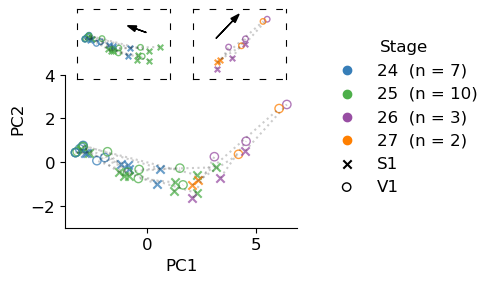

In [31]:
# Specify variables
labels = ['ID','Location']
variables = [
                'wave_duration',
                'wave_size',
                'wave_area',
                'wave_distance',
                'ggm_num_nodes_gc',
                'ggm_node_strength',
                'ggm_num_assemblies',
                'ggm_assembly_size',
                'ggm_modularity',
            ]

# Specify plot labels for variables
y_labels = [
               'Event duration',
               'Event size',
               'Event area',
               'Event distance',
               'Giant component size',
               'Mean node strength',
               'No. assemblies',
               'Mean assembly size',
               'Modularity',
            ]

variable_dict = {
    'ID':'first',
    'Age':'first',
    'Stage':'first',
    'Location':'first',
    'EP age':'first'}

variable_dict.update({v:np.nanmean for v in variables})

# Filter dataframe
df2 = df.groupby(['ID','Location']).agg(variable_dict)
df2.fillna(value=0,inplace=True)

stages = [24,25,26,27]

df2 = df2[df2['Stage'].isin(stages)]

for ID in df2['ID'].unique():
    if (df2['ID']==ID).sum()<2:
        df2 = df2[~(df2['ID']==ID)]

Y = df2['Location']
IDs = df2['ID'].values
stage = df2['Stage'].values.reshape(-1, 1)
Y = [0 if loc=='S1' else 1 for loc in Y ]
X = df2[variables]

X = preprocessing.StandardScaler().fit_transform(X)


pca = PCA(n_components=None,whiten=False)
Z = pca.fit_transform(X)
loc = ['S1','V1']

#######################################################################
# Plot
colors = cm.Set1(range(5))
markers = ['x','o']


fig,ax = plt.subplots(
              figsize=(3,3),
              nrows=1,
              ncols=1,
#               sharey=True
          )

for ID in np.unique(IDs):
    for i,location in enumerate(loc):
        idx = (IDs==ID) & (np.array(Y)==i)
        x = Z[idx,0]
        y = Z[idx,1]
        if i==1:
            fc='none'
            ec=colors[stage[idx][0]-23,:]
        else:
            fc=colors[stage[idx][0]-23,:]
            ec=None
        ax.scatter(Z[idx,0],Z[idx,1],
                   facecolors=fc,
                   edgecolors=ec,
                marker=markers[i],
               alpha=0.75)
        
for ID in np.unique(IDs):
    idx = IDs==ID
    x = Z[idx,0]
    y = Z[idx,1]

    ax.plot(x,y,ls=':',c='k',alpha=0.2)
    
# Get difference vectors (with S1-->V1 direction)
zdiff = []
for ID in np.unique(IDs[:-2]):
    idx = (
              (IDs==ID).flatten()
              & (np.array(Y)==0).flatten()
              & (np.array(stage)<26).flatten()
          )
    if sum(idx):
        zS1 = Z[idx,:2][0]
        jdx = (
                  (IDs==ID).flatten()
                  & (np.array(Y)==1).flatten()
                  & (np.array(stage)<26).flatten()
              )
        zV1 = Z[jdx,:2][0]
        zdiff.append((zV1-zS1))
zdiff_young = np.stack(zdiff).mean(axis=0)
zdiff = []
for ID in np.unique(IDs[:-2]):
    idx = (
              (IDs==ID).flatten()
              & (np.array(Y)==0).flatten()
              & (np.array(stage)>=26).flatten()
          )
    if sum(idx):
        zS1 = Z[idx,:2][0]
        jdx = (
                  (IDs==ID).flatten()
                  & (np.array(Y)==1).flatten()
                  & (np.array(stage)>=26).flatten()
              )
        zV1 = Z[jdx,:2][0]
        zdiff.append((zV1-zS1))
zdiff_old = np.stack(zdiff).mean(axis=0)


    
# dummy plots for legend
stages = df2['Stage'].values
for stg in np.unique(stages):
    idx = (stg==stages) & (np.array(Y)==0)
    lblstr = ''.join(["{:g} ".format(stg),f' (n = {sum(idx)})'])
    ax.scatter([],[],color=colors[stg-23],
            label=lblstr,
               marker = 'o',
           )
dummy_ax = []
for j,location in enumerate(loc):
    if j==1:
        fc='none'
        ec='k'
    else:
        fc = 'k'
        ec=None
    d = ax.scatter([],[],marker=markers[j],label=location,color=fc,
                  edgecolors=ec)
    dummy_ax.append(d)

legend1 = fig.legend(
               title='Stage',
               loc='right',
               bbox_to_anchor=(1.55, 0.5),
               frameon=False,
               fontsize=fontsize
           )
legend1.set_title('Stage',prop={'size':fontsize})

ax.set_ylim((-3,7))
# ax.set_xlim(-1.5,2)
ax.set_yticks([-2,0,2,4])
ax.set_aspect('equal')
ax.set_xlabel('PC1',fontsize=fontsize)
ax.set_ylabel('PC2',fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_bounds((ax.get_ylim()[0],4)) 

# Add individual inset axes:
axin1 = ax.inset_axes([0.05, 0.68, 0.4, 0.32])
axin2 = ax.inset_axes([0.55, 0.68, 0.4, 0.32])
for ID in np.unique(IDs):
    for i,location in enumerate(loc):
        idx = (IDs==ID) & (np.array(Y)==i)
        x = Z[idx,0]
        y = Z[idx,1]
        if i==1:
            fc='none'
            ec=colors[stage[idx][0]-23,:]
        else:
            fc = colors[stage[idx][0]-23,:]
            ec=None
        if stage[idx]<26:
            ax = axin1
        else:
            ax = axin2
        ax.scatter(Z[idx,0],Z[idx,1],16,
                   facecolors=fc,
                   edgecolors=ec,
                marker=markers[i],
               alpha=0.75)
x0s = [2,2]
y0s = [1,1]
for ax,zdiff,x0,y0 in zip([axin1,axin2],[zdiff_young,zdiff_old],x0s,y0s):
    ax.arrow(
        x0,
        y0,
        zdiff[0],
        zdiff[1],
        head_width=0.5,
        color='k',
        length_includes_head=True
    )

        
for ID in np.unique(IDs):
    idx = IDs==ID
    x = Z[idx,0]
    y = Z[idx,1]
    if all(stage[idx]<26):
        ax = axin1
    else:
        ax = axin2
    ax.plot(x,y,ls=':',c='k',alpha=0.2)

xlims = [[-4,4],[0,8]]
ylims = [[-3,3],[-2.5,3.5]]
for ax,xlim,ylim in zip([axin1, axin2],xlims,ylims):
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_xticks([])
    ax.set_yticks([])
    ls = (0,(5,10))
    ax.spines['bottom'].set_linestyle(ls)
    ax.spines['top'].set_linestyle(ls)
    ax.spines['left'].set_linestyle(ls)
    ax.spines['right'].set_linestyle(ls)
    
fig.savefig(figpath / 'pca_S1vsV1.pdf',bbox_inches='tight')





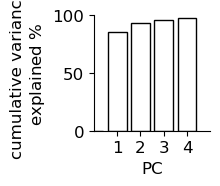

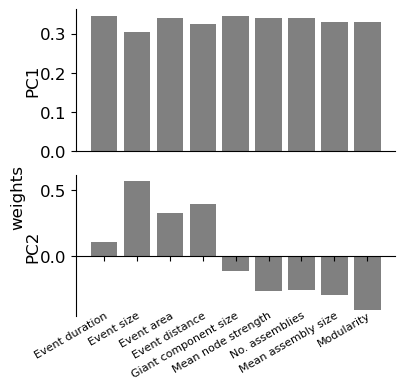

In [32]:
#######################################################################

# Variance explained
fig,ax = plt.subplots(figsize=(1.5,1.5))
y = pca.explained_variance_ratio_
y = np.hstack([0,np.cumsum(y)[:4]])*100
ax.bar(np.arange(y.shape[0]),height=y,color='none',edgecolor='black')
ax.set_xticks([1,2,3,4])
ax.set_xlim([0,5])
ax.set_ylim([0,100])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel(
    'cumulative variance\n' + r'explained $\%$',
    fontsize=fontsize,
)
ax.set_xlabel(
    'PC',
    fontsize=fontsize,
)
ax.tick_params(labelsize=fontsize)
fig.savefig(figpath / 'pca_var_explained.pdf',bbox_inches='tight')

#######################################################################

# Components
fig,axs = plt.subplots(nrows=2,ncols=1,figsize=(4,4),tight_layout=True)
pc_index = [0,1]

for j,idx in enumerate(pc_index):
    ax = axs[j]
    x = np.arange(pca.components_.shape[1])
    h = ax.bar(x,height=pca.components_[idx,:],
                  color='Gray',edgecolor='none')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_position('zero')
    ax.set_ylabel(f'PC{idx+1}',labelpad=0,fontsize=fontsize)
    ax.tick_params(labelsize=fontsize)
        
    if j==1:
        ax.set_xticks(x)
        ax.set_xticklabels(
               np.array(y_labels),
               rotation=30,
               ha='right',
               rotation_mode="anchor",
               fontdict={'fontsize':8},
            )
        ax.xaxis.set_tick_params(direction='out', pad=35)
    else:
        ax.set_xticks([])
fig.align_ylabels()
lbl_pos = (axs[0].get_position().extents[1] + axs[1].get_position().extents[3])/2
fig.text(0,lbl_pos,'weights', ha='left', va='center', rotation='vertical',
        fontsize=fontsize)
fig.savefig(figpath / 'pca_components.pdf',bbox_inches='tight')

#######################################################################

<a id='regionprofile'></a>
### Activity feature profiles

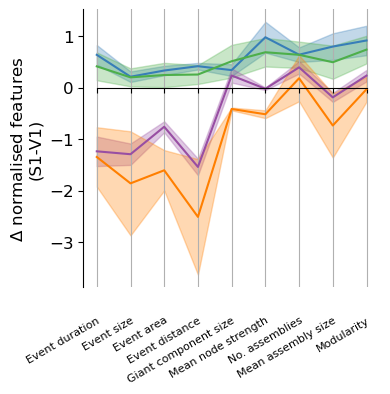

In [33]:
# Feature difference
stage = df2['Stage'].values
colors = cm.Set1(range(5))
fig,ax = plt.subplots(figsize=(4,4),tight_layout=True)

u = []
grp = []
for ID in np.unique(IDs):
    idx = IDs==ID
    u.append(X[idx][0]-X[idx][1])
    grp.append(stage[idx][0])
u = np.stack(u)

for j,stg in enumerate(np.unique(stages)):
    idx = grp==stg
    y = u[idx,:].mean(axis=0)
    yerr = sem(u[idx,:],axis=0)
    x = range(y.shape[0])
    ax.plot(x,y,color=colors[j+1])
    ax.fill_between(
       x,
       y-yerr,
       y+yerr,
       alpha=0.3,
       color=colors[j+1]
       )
    
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_position('zero')
ax.spines['bottom'].set_bounds(0,8)
ax.set_xticks(x)
ax.tick_params(labelsize=fontsize)
ax.set_xticklabels(
   np.array(y_labels),
   rotation=30,
   ha='right',
   rotation_mode="anchor",
   fontdict={'fontsize':8},
)
ax.xaxis.set_tick_params(direction='out', pad=160)
ax.set_ylabel(
    r'$\Delta$ normalised features'+'\n(S1-V1)',
    fontsize=fontsize
)
ax.grid('on',axis='x')

fig.savefig(figpath / 'feature_profiles.pdf',bbox_inches='tight')



## Investigation of individual transients in different regions at onset

<a id='transients'></a>
### Extract and embed individual calcium transients

In [34]:
C = []
for dff,b in zip(F,B):
    X = dff.reshape(dff.shape[0],dff.shape[1]*dff.shape[2])
    BW = b.reshape(b.shape[0],b.shape[1]*b.shape[2])
    c = []
    for j in range(X.shape[1]):
        x = X[:,j]
        bw = BW[:,j]
        labels,_ = ndimage.label(bw)
        cc = ndimage.find_objects(labels)
        c = c+[x[idx] for idx in cc]
    C.append(c)
    

In [35]:
# Transient duration
D = []
for c in C:
    D.append([x.size for x in c])

# Stack and pad profiles
dmin = 3
stages = [23,24,25]
regions = ['S1','V1']

X = []
R = []
S = []
DUR = []
ID = []

dmax = max([max(d) for d in D])

for i,(c,d) in enumerate(zip(C,D)):
    if (
           (df['Stage'][i] not in stages)
           | (df['EP age'][i]>12)
       ):
        continue
    X += [np.pad(x,(0,dmax-len(x)),mode='constant') for x,y in zip(c,d) if y>=dmin]
    DUR += [y for y in d if y>=dmin]
    r = df['Location'][i]
    s = df['Stage'][i]
    did = df['Matlab ID'][i]
    R += [r for j in range(np.sum(np.array(d)>=dmin))]
    S += [s for j in range(np.sum(np.array(d)>=dmin))]
    ID += [did for j in range(np.sum(np.array(d)>=dmin))] 
    
X = np.stack(X)
R = np.stack(R)
S = np.stack(S)
ID = np.stack(ID)
D = np.stack(DUR)


In [36]:
pca = PCA(n_components=10,whiten=False)
Y = pca.fit_transform(X)

In [37]:
tsne = TSNE(
    n_components=2,
    perplexity=50,
    learning_rate=200,
    n_iter=1000,
    init='pca',
    verbose=0,
    n_jobs=-1,
    
)

In [38]:
Z = tsne.fit_transform(Y)

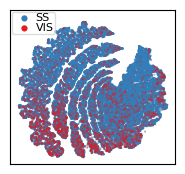

In [39]:
from matplotlib import colors, cm
fig,ax = plt.subplots(
    figsize=(3,2),
    ncols=1,
)
cmap = colors.ListedColormap(['#337eb8','#e41a1c'])
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim(-66,66)
ax.set_ylim(-55,68)

idx = (R=='S1')
ax.scatter(Z[idx,0],Z[idx,1],s=2,c='#337eb8',alpha=0.3,edgecolors='none')
idx = (R=='V1')
ax.scatter(Z[idx,0],Z[idx,1],s=2,c='#e41a1c',alpha=0.3,edgecolors='none')
# Dummy for legend
h = ax.scatter([],[],s=20,c='#337eb8',alpha=1,edgecolors='none',label='SS')
h = ax.scatter([],[],s=20,c='#e41a1c',alpha=1,edgecolors='none',label='VIS')
ax.set_aspect('equal')

hleg = ax.legend(fontsize=8,handletextpad=0,labelspacing=0,borderaxespad=0.2,borderpad=0.1,ncol=1,columnspacing=0.1,framealpha=0.65,loc='upper left')

fig.savefig(figpath / 'tsne_regions_all.pdf',dpi=300,bbox_inches='tight')


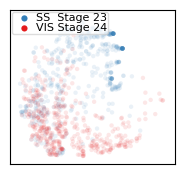

In [40]:
fig,ax = plt.subplots(
    figsize=(3,2),
    ncols=1,
)
cmap = colors.ListedColormap(['#337eb8','#e41a1c'])
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim(-66,66)
ax.set_ylim(-55,68)

idx = (R=='S1') & (S==23)
ax.scatter(Z[idx,0],Z[idx,1],s=10,c='#337eb8',alpha=0.1,edgecolors='none')
idx = (R=='V1') & (S==24)
ax.scatter(Z[idx,0],Z[idx,1],s=10,c='#e41a1c',alpha=0.1,edgecolors='none')
# Dummy for legend
h = ax.scatter([],[],s=20,c='#337eb8',alpha=1,edgecolors='none',label='SS  Stage 23')
h = ax.scatter([],[],s=20,c='#e41a1c',alpha=1,edgecolors='none',label='VIS Stage 24')
ax.set_aspect('equal')

hleg = ax.legend(fontsize=8,handletextpad=0,labelspacing=0,borderaxespad=0.2,borderpad=0.1,ncol=1,columnspacing=0.1,framealpha=0.65)
fig.savefig(figpath / 'tsne_regions_23-24.pdf',dpi=300,bbox_inches='tight')

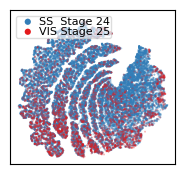

In [41]:
fig,ax = plt.subplots(
    figsize=(3,2),
    ncols=1,
)
cmap = colors.ListedColormap(['#337eb8','#e41a1c'])
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim(-66,66)
ax.set_ylim(-55,68)

idx = (R=='S1') & (S==24)
ax.scatter(Z[idx,0],Z[idx,1],s=2,c='#337eb8',alpha=0.3,edgecolors='none')
idx = (R=='V1') & (S==25)
ax.scatter(Z[idx,0],Z[idx,1],s=2,c='#e41a1c',alpha=0.3,edgecolors='none')
# Dummy for legend
h = ax.scatter([],[],s=20,c='#337eb8',alpha=1,edgecolors='none',label='SS  Stage 24')
h = ax.scatter([],[],s=20,c='#e41a1c',alpha=1,edgecolors='none',label='VIS Stage 25')
ax.set_aspect('equal')

hleg = ax.legend(fontsize=8,handletextpad=0,labelspacing=0,borderaxespad=0.5,borderpad=0.1,ncol=1,columnspacing=0.1,loc='upper left',framealpha=0.65)
fig.savefig(figpath / 'tsne_regions_24-25.pdf',dpi=300,bbox_inches='tight')

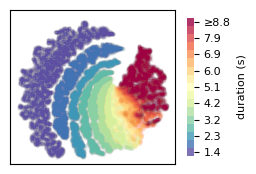

In [42]:
from matplotlib import colors, cm
fig,ax = plt.subplots(
    figsize=(3,2),
    ncols=1,
)
cmap2 = mpl.colormaps.get_cmap('Spectral_r').resampled(17)

ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim(-66,66)
ax.set_ylim(-55,68)


for d in np.unique(D):
    idx = D==d
    ax.scatter(Z[idx,0],Z[idx,1],c=np.array(cmap2(d-3)).reshape(1,-1),s=5,alpha=0.01)
# Dummy for colorbar
dt = 1/df['frameRate'][0]
h = ax.scatter([],[],s=5,c=[],vmin=3,vmax=20,alpha=0.8,edgecolors='none',cmap=cmap2)
ax.set_aspect('equal')

cax = plt.colorbar(h,shrink=0.9)
cax.outline.set_visible(False)
cax.set_ticks((np.arange(3,20,2)+0.5))
ticklabels = list(np.round((np.arange(3,20,2))*dt,1))
ticklabels = [f'{x:.1f}' for x in ticklabels]
ticklabels[-1] = '\u2265' + ticklabels[-1]
cax.set_ticklabels(ticklabels)
cax.ax.tick_params(labelsize=8)
cax.set_label('duration (s)',fontsize=8)

fig.savefig(figpath / 'tsne_duration.pdf',dpi=300,bbox_inches='tight')

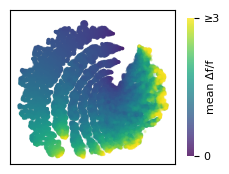

In [43]:
from matplotlib import colors, cm
fig,ax = plt.subplots(
    figsize=(3,2),
)

ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim(-66,66)
ax.set_ylim(-55,68)

cvals = X.sum(axis=1)/D
ax.scatter(Z[:,0],Z[:,1],c=cvals,vmin=0,vmax=3,s=2,alpha=0.1,cmap='viridis')

# Dummy for colorbar
h = ax.scatter([],[],s=2,c=[],alpha=0.8,vmin=0,vmax=3,edgecolors='none',cmap='viridis')
ax.set_aspect('equal')

cax = plt.colorbar(h,shrink=0.9)
cax.outline.set_visible(False)
cax.set_ticks([0,3])
cax.set_ticklabels(['0','\u22653'])
cax.ax.tick_params(labelsize=8)
cax.set_label('mean \u0394f/f',labelpad=-10,fontsize=8)

fig.savefig(figpath / 'tsne_meandff.pdf',dpi=300,bbox_inches='tight')

<a id='meandff'></a>
### Mean $\Delta F/F$ between regions

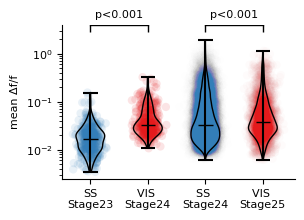

In [44]:
from matplotlib import ticker as mticker

w = 0.1
ascale=50.0
barwidth=0.6
fig,ax = plt.subplots(
    figsize=(3,2),
)

'#337eb8','#e41a1c'

Y = X.copy()
Y[Y==0]==np.nan
y = np.nanmean(Y,axis=1)
y = np.log10(y)

idx0 = (R=='S1') & (S==23)
idx1 = (R=='V1') & (S==24)
x0 = np.random.randn(idx0.sum())*w + 1
x1 = np.random.randn(idx1.sum())*w + 2
ax.scatter(x0,(y[idx0]),alpha=ascale/x0.size,color='#337eb8',edgecolor='none')
violin = ax.violinplot(y[idx0],positions=[1],showmedians=True)
for v in violin['bodies']:
    v.set_facecolor('none')
    v.set_edgecolor('k')
    v.set_linewidth(1)
    v.set_alpha(1)
violin['cbars'].set_color('k')
violin['cmins'].set_color('k')
violin['cmaxes'].set_color('k')
violin['cmedians'].set_color('k')
violin['cmedians'].set_linewidth(1)
ax.scatter(x1,(y[idx1]),alpha=ascale/x1.size,color='#e41a1c',edgecolor='none')
violin = ax.violinplot(y[idx1],positions=[2],showmedians=True)
for v in violin['bodies']:
    v.set_facecolor('none')
    v.set_edgecolor('k')
    v.set_linewidth(1)
    v.set_alpha(1)
violin['cbars'].set_color('k')
violin['cmins'].set_color('k')
violin['cmaxes'].set_color('k')
violin['cmedians'].set_color('k')
violin['cmedians'].set_linewidth(1)
_,pval12 = ranksums(y[idx0],y[idx1])

idx0 = (R=='S1') & (S==24)
idx1 = (R=='V1') & (S==25)
x0 = np.random.randn(idx0.sum())*w + 3
x1 = np.random.randn(idx1.sum())*w + 4
ax.scatter(x0,(y[idx0]),alpha=np.max([ascale/x0.size,0.002]),color='#337eb8',edgecolor='none')
violin = ax.violinplot(y[idx0],positions=[3],showmedians=True)
for v in violin['bodies']:
    v.set_facecolor('none')
    v.set_edgecolor('k')
    v.set_linewidth(1)
    v.set_alpha(1)
violin['cbars'].set_color('k')
violin['cmins'].set_color('k')
violin['cmaxes'].set_color('k')
violin['cmedians'].set_color('k')
violin['cmedians'].set_linewidth(1)
ax.scatter(x1,(y[idx1]),alpha=ascale/x1.size,color='#e41a1c',edgecolor='none')
violin = ax.violinplot(y[idx1],positions=[4],showmedians=True,bw_method='silverman')
for v in violin['bodies']:
    v.set_facecolor('none')
    v.set_edgecolor('k')
    v.set_linewidth(1)
    v.set_alpha(1)
violin['cbars'].set_color('k')
violin['cmins'].set_color('k')
violin['cmaxes'].set_color('k')
violin['cmedians'].set_color('k')
violin['cmedians'].set_linewidth(1)
_,pval34 = ranksums(y[idx0],y[idx1])

plot_overline(
    ax,
    [1,2],
    0.6,
    0.1,
    pval12,
    linewidth=1,
    font_size=8,
    color='black',
    print_as='numeric',
    sig_digits=3,
    endcap_length=0.05,
)

plot_overline(
    ax,
    [3,4],
    0.6,
    0.1,
    pval34,
    linewidth=1,
    font_size=8,
    color='black',
    print_as='numeric',
    sig_digits=3,
    endcap_length=0.05,
)

ax.yaxis.set_major_formatter(mticker.StrMethodFormatter("$10^{{{x:.0f}}}$"))
ymin, ymax = ax.get_ylim()
tick_range = np.arange(-3.0, 1)
ax.yaxis.set_ticks(tick_range)
ax.yaxis.set_ticks([np.log10(x) for p in tick_range for x in np.linspace(10 ** p, 10 ** (p + 1), 10)], minor=True)
ax.set_ylim(-2.6,0.6)
ax.tick_params(labelsize=8)

ax.set_ylim()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xticks([1,2,3,4])
ax.set_xticklabels(['SS\nStage23','VIS \nStage24','SS \nStage24','VIS \nStage25'],fontsize=8)
ax.set_ylabel('mean \u0394f/f',fontsize=8)

fig.savefig(figpath / 'regions_meandff_stats.pdf',dpi=300,bbox_inches='tight')

<a id='wavemov'></a>
## Wave tracking illustrations

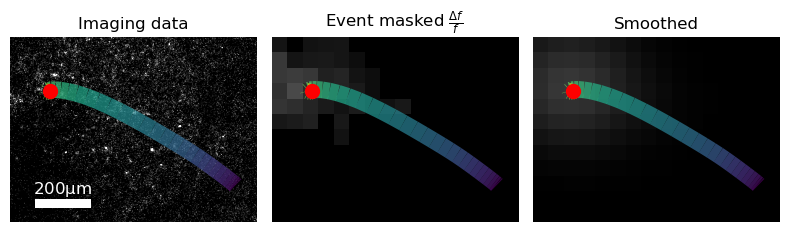

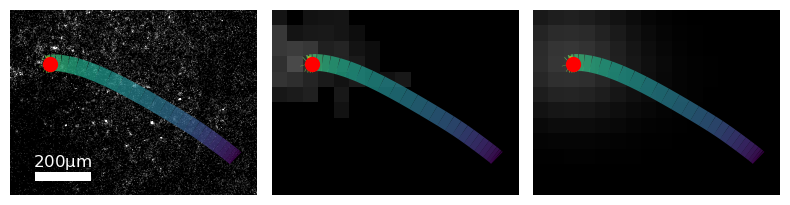

In [45]:
# Wave tracking frames for illustration
d = 38
wave_idx = 6
nframes = 36 # Number of frames to render (only plot a subset of an 
             # event).
dff = F[d]
labels = CC[d]['labels']
labels = labels==(wave_idx+1)
cc = CC[d]['cc'][wave_idx:wave_idx+1]
start_frame = cc[0][0].start
cc = [
         [
             slice(start_frame,start_frame+nframes,None),
             cc[0][1],
             cc[0][2]
         ]
     ]
min_duration = CC[d]['min_duration']
min_total_size = CC[d]['min_total_size']
min_voxels = CC[d]['min_voxels']

f = df['fpath'][d]

# Load imaging data
if f[-3:] =='lsm':
    im = tf.imread(f).squeeze()
else:
    im = cz.imread(f).squeeze()

wave_peak_tracker(
    dff,
    labels,
    cc,
    min_duration,
    min_total_size,
    min_voxels,
    max_speed=4,
    generate_movie=True,
    save_frames=True,
    im=im,
    line_width=12,
    marker_size=100,
    vmax=31,
    movie_path=figpath / f"wave_tracking_{df['Matlab ID'][d]}.mp4",
    frame_path=figpath / "frames/",
    bin_edge_len=bin_edge_len,
    scale_bar=True,
    scale_bar_length=200,
    scale_bar_pos=(0.1,0.1),
    scale_bar_width=0.05,
    scale=df['Pixel Size '][0],
    scale_bar_units='$\mathrm{\mu m}$',
    scale_bar_color='w',
    playback_annotation=False,
    playback_multiplier=3,
);

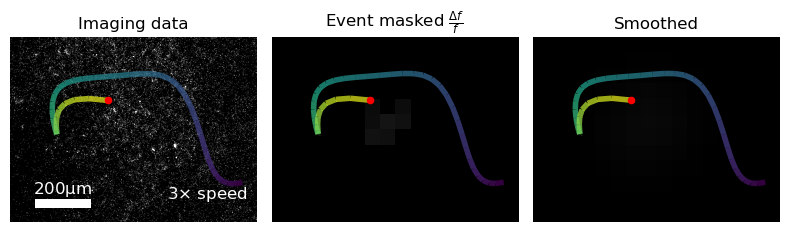

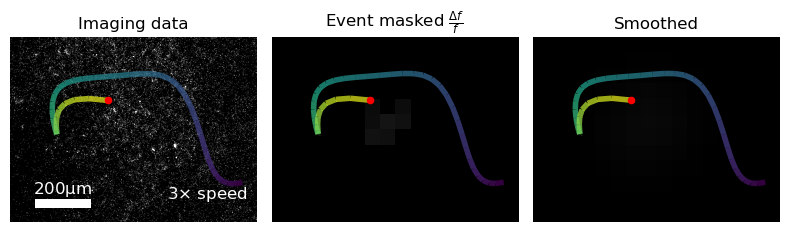

In [46]:
# Wave tracking movie for supp
d=38
dff = F[d]
labels = CC[d]['labels']
cc = CC[d]['cc']
min_duration = CC[d]['min_duration']
min_total_size = CC[d]['min_total_size']
min_voxels = CC[d]['min_voxels']

f = df['fpath'][d]

# Load imaging data
if f[-3:] =='lsm':
    im = tf.imread(f).squeeze()
else:
    im = cz.imread(f).squeeze()

wave_peak_tracker(
    dff,
    labels,
    cc,
    min_duration,
    min_total_size,
    min_voxels,
    max_speed=4,
    generate_movie=True,
    im=im,
    vmax=31,
    movie_path=figpath / 'wave_tracking.mp4',
    bin_edge_len=bin_edge_len,
    scale_bar=True,
    scale_bar_length=200,
    scale_bar_pos=(0.1,0.1),
    scale_bar_width=0.05,
    scale=df['Pixel Size '][0],
    scale_bar_units='$\mathrm{\mu m}$',
    scale_bar_color='w',
    playback_annotation=True,
    playback_ann_pos=(0.8,0.1),
    playback_multiplier=3,
);

<a id='other'></a>
## Additional figures

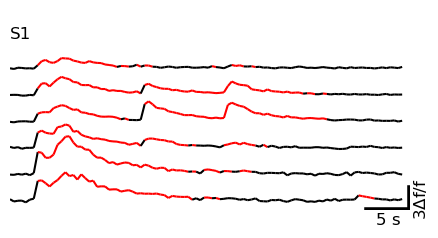

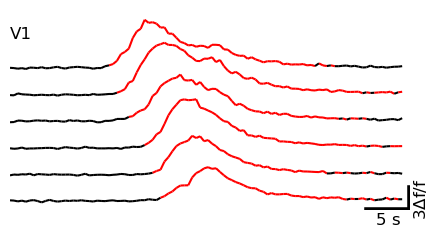

In [47]:
n_traces = 6
squash_factor = 2
fontsize = 12
fps = df['frameRate'][0]
ax_width = 1
fig_height = 1
xlim_trunc = 0.02
ylim_trunc= 1

# Recordings
IDs = [
          "20170824-d4",
          "20170824-d11"
      ]

# ROIs
J = [
        np.arange(69,75),
        np.arange(66,72)
    ]

T = [
        np.arange(1035,1135),
        np.arange(140,240),
    ]

LBL = [
          'S1',
          'V1',
      ]

XBAR = [
           5,
           5,
       ]

YBAR = [
           3,
           3,
       ]

YMAX = [
           8,
           8
       ]

for dunnart_id,j,t,lbl,xbar,ybar,ymax in zip(IDs,J,T,LBL,XBAR,YBAR,YMAX):
    d = df[df['Matlab ID']==dunnart_id].index.values[0]
    fig, axs = plt.subplots(nrows=n_traces,ncols=1,figsize=(4,2),)
    dff = F[d]
    dff = dff.reshape(dff.shape[0],-1)
    b = B[d]
    b = b.reshape(b.shape[0],-1)
    for k,ax in enumerate(axs):
        # Plot below threshold
        mask = b[t,:][:,j][:,k]
        y = dff[t,:][:,j][:,k]
        x = np.arange(y.size)/fps

        
        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        cmap = ListedColormap(['k', 'r'])
        norm = BoundaryNorm([0, 0.5, 1], cmap.N)
        lc = LineCollection(segments, cmap=cmap, norm=norm)
        lc.set_array(mask)

        # Add a collection of lines
        ax.add_collection(lc)

        # Format
        ax.autoscale(enable=True,tight=True)
        xlim = ax.get_xlim()
        ax.set_xlim(
            [
                xlim[0],
                xlim[1] + np.ptp(xlim)*xlim_trunc
            ]
        )
        ylim = ax.get_ylim()
        ax.set_ylim(
            [
                ylim[0] - ylim_trunc,
                ymax
            ]
        )
        ax.axis('off')
        ax.set(facecolor = "none")
    
    # Add label
    ax = axs[0]
    ax.text(
        x=0.0,
        y=0.75,
        s=lbl,
        ha='left',
        va='top',
        fontsize=fontsize,
        transform=ax.transAxes,
    )
    
    # Add x-scale bar
    ax = axs[n_traces-1]
    data_to_axis = ax.transData + ax.transAxes.inverted()
    bar_len = data_to_axis.transform([
                                               (0,0),
                                               (xbar,0),
                                           ])[:,0]
    bar_len = np.abs(np.diff(bar_len)[0])
    x = [ax_width-bar_len,ax_width]
    y = [0,0]
    line = lines.Line2D(
        x,
        y,
        color='k',
        linewidth=4,
        linestyle='-',
        transform=ax.transAxes,
    )
    ax.add_line(line)
    pltstr = f'{xbar} s'
    ax.text(
        np.mean(x),
        y[0]-0.05,
        pltstr,
        ha='center',
        va='top',
        fontsize=fontsize,
        transform=ax.transAxes
    )
    
    # Add y-scale bar
    ax = axs[n_traces-1]
    bar_len = data_to_axis.transform([
                                               (0.05,0.05),
                                               (0,ybar),
                                           ])[:,1]
    bar_len = np.abs(np.diff(bar_len)[0])
    y = [0,bar_len]
    x = [ax_width,ax_width]
    line = lines.Line2D(
        x,
        y,
        color='k',
        linewidth=4,
        linestyle='-',
        transform=ax.transAxes,
    )
    ax.add_line(line)
    pltstr = f"{ybar}" + "$\Delta$f/f"
    ax.text(
        x[0]+0.005,
        np.mean(y),
        pltstr,
        ha='left',
        va='center',
        fontsize=fontsize,
        rotation=90,
        transform=ax.transAxes
    )
    
    
    
    # squash axes
    for i,ax in enumerate(axs):
        height = (1/n_traces)*squash_factor
        pos = [
                  0,
                  fig_height-i*((fig_height-height)/(n_traces-1)),
                  ax_width,
                  height,
              ]
        ax.set_position(pos)
    
    fig.savefig(
    figpath / ('example_dff_'+ lbl + '.pdf'),
    bbox_inches='tight',
    transparent=True,
    pad_inches=0
    )   

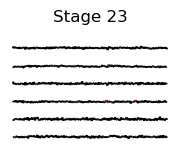

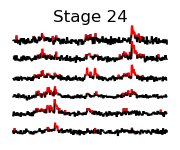

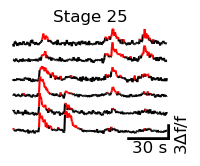

In [48]:
n_traces = 6
squash_factor = 1.2
fontsize = 12
fps = df['frameRate'][0]
ax_width = 1
fig_height = 1
xlim_trunc = 0.02
ylim_trunc=0.3
ymax = 5

# Recordings
IDs = [
          "20190306-d2",
          "20191116-d3",
          "20190716-d2"
      ]

# ROIs
J = [
        np.arange(134,140),
        np.arange(134,140),
        np.arange(132,138),
    ]

T = [
        np.arange(0,400),
        np.arange(750,1150),
        np.arange(1250,1500),
    ]

LBL = [
          '',
          '',
          '',
      ]

XBAR = [
           0,
           0,
           30,
       ]

YBAR = [
           0,
           0,
           3
       ]

TTL = [
          'Stage 23',
          'Stage 24',
          'Stage 25',
      ]

stages = [23,24,25]

for dunnart_id,j,t,lbl,xbar,ybar,ttl,stage in zip(IDs,J,T,LBL,XBAR,YBAR,TTL,stages):
    d = df[df['Matlab ID']==dunnart_id].index.values[0]
    fig, axs = plt.subplots(nrows=n_traces,ncols=1,figsize=(2,1.5),)
    dff = F[d]
    dff = dff.reshape(dff.shape[0],-1)
    b = B[d]
    b = b.reshape(b.shape[0],-1)
    for k,ax in enumerate(axs):
        # Plot below threshold
        mask = b[t,:][:,j][:,k]
        y = dff[t,:][:,j][:,k]
        x = np.arange(y.size)/fps

        
        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        cmap = ListedColormap(['k', 'r'])
        norm = BoundaryNorm([0, 0.5, 1], cmap.N)
        lc = LineCollection(segments, cmap=cmap, norm=norm)
        lc.set_array(mask)

        # Add a collection of lines
        ax.add_collection(lc)

        # Format
        ax.autoscale(enable=True,tight=True)
        ax.axis('off')
        ax.set(facecolor = "none")
        xlim = ax.get_xlim()
        ax.set_xlim(
            [
                xlim[0] - np.ptp(xlim)*xlim_trunc,
                xlim[1] + np.ptp(xlim)*xlim_trunc
            ]
        )
        ylim = ax.get_ylim()
        ax.set_ylim(
            [
                ylim[0] - np.ptp(ylim)*ylim_trunc,
                ymax
            ]
        )
        
    
    # Add label
    ax = axs[0]
    ax.text(
        x=0.0,
        y=0.75,
        s=lbl,
        ha='left',
        va='top',
        fontsize=fontsize,
        transform=ax.transAxes,
    )
    
    fig.subplots_adjust(top=0.8)
    fig.suptitle(ttl,fontsize=fontsize)
    
    # squash axes
    upper = axs[0].get_position().extents[3]
    lower = axs[n_traces-1].get_position().extents[1]
    for i,ax in enumerate(axs):
        height = (1/n_traces)*squash_factor
        pos = ax.get_position().bounds
#         pos = [p for p in pos[:3]] + [height]
        pos = [pos[0]-0.025, pos[1], pos[2]+0.025, height]
        ax.set_position(pos)
    
    if (xbar>0) and (ybar>0):
        # Add x-scale bar
        ax = axs[n_traces-1]
        data_to_axis = ax.transData + ax.transAxes.inverted()
        bar_len = data_to_axis.transform([
                                                   (0,0),
                                                   (xbar,0),
                                               ])[:,0]
        bar_len = np.abs(np.diff(bar_len)[0])
        x = [ax_width-bar_len,ax_width]
        y = [0,0]
        line = lines.Line2D(
            x,
            y,
            color='k',
            linewidth=4,
            linestyle='-',
            transform=ax.transAxes,
        )
        ax.add_line(line)
        pltstr = f'{xbar} s'
        ax.text(
            np.mean(x),
            y[0]-0.02,
            pltstr,
            ha='center',
            va='top',
            fontsize=fontsize,
            transform=ax.transAxes
        )

        # Add y-scale bar
        ax = axs[n_traces-1]
        bar_len = data_to_axis.transform([
                                                   (0,0),
                                                   (0,ybar),
                                               ])[:,1]
        bar_len = np.abs(np.diff(bar_len)[0])
        y = [0,bar_len]
        x = [ax_width,ax_width]
        line = lines.Line2D(
            x,
            y,
            color='k',
            linewidth=4,
            linestyle='-',
            transform=ax.transAxes,
        )
        ax.add_line(line)
        pltstr = f"{ybar}" + "$\Delta$f/f"
        ax.text(
            x[0]+0.02,
            np.mean(y),
            pltstr,
            ha='left',
            va='center',
            fontsize=fontsize,
            rotation=90,
            transform=ax.transAxes
        )

    
    

    fig.savefig(
    figpath / ('ggm_dff_'+ 'S1' +'_' + str(stage) +'.pdf'),
#     bbox_inches='tight',
    transparent=True,
    pad_inches=0
    )
    
        

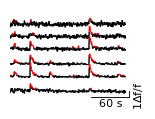

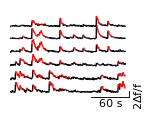

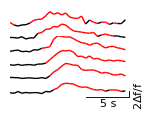

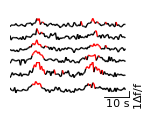

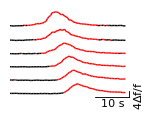

In [49]:
n_traces = 6
squash_factor = 1.35
fontsize = 8
fps = df['frameRate'][0]
ax_width = 1
fig_height = 1
xlim_trunc = 0.04
ylim_trunc=0.4

IDs = [
          "20190726-d1",
          "20190709-d2",
          "20201115-d11",
          "20201115-d11",
          "20170824-d12"
      ]

# ROIs
J = [
        np.arange(131,137),
        np.arange(69,75),
        np.array([72+16*j for j in range(n_traces)])[::-1],
        np.array([5+16*j for j in range(n_traces)])[::-1],
        np.arange(80,86),
    ]

T = [
        np.arange(3000,3400),
        np.arange(1900,2300),
        np.arange(690,720),
        np.arange(950,1050),
        np.arange(1925,2000),
    ]


XBAR = [
           60,
           60,
           5,
           10,
           10,
       ]

YBAR = [
           1,
           2,
           2,
           1,
           4,
       ]

YMAX = [
           3,
           6,
           6,
           3,
           12
       ]

LOC = [
          'S1',
          'S1',
          'V1',
          'V1_2',
          'V1',
      ]

stages = [24,25,25,25,26]

for dunnart_id,j,t,xbar,ybar,ymax,loc,stg in zip(IDs,J,T,XBAR,YBAR,YMAX,LOC,stages):
    d = df[df['Matlab ID']==dunnart_id].index.values[0]
    fig, axs = plt.subplots(nrows=n_traces,ncols=1,figsize=(1.5,1),)
    dff = F[d]
    dff = dff.reshape(dff.shape[0],-1)
    b = B[d]
    b = b.reshape(b.shape[0],-1)
    for k,ax in enumerate(axs):
        # Plot below threshold
        mask = b[t,:][:,j][:,k]
        y = dff[t,:][:,j][:,k]
        x = np.arange(y.size)/fps

        
        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        cmap = ListedColormap(['k', 'r'])
        norm = BoundaryNorm([0, 0.5, 1], cmap.N)
        lc = LineCollection(segments, linewidth=1, cmap=cmap, norm=norm)
        lc.set_array(mask)

        # Add a collection of lines
        ax.add_collection(lc)

        # Format
        ax.autoscale(enable=True,tight=True)
        xlim = ax.get_xlim()
        ax.set_xlim(
            [
                xlim[0],
                xlim[1] + np.ptp(xlim)*xlim_trunc
            ]
        )
        ylim = ax.get_ylim()
        ax.set_ylim(
            [
                ylim[0] - np.ptp(ylim)*ylim_trunc,
                ymax
            ]
        )
        ax.axis('off')
        ax.set(facecolor = "none")
    
    # Add x-scale bar
    ax = axs[n_traces-1]
    data_to_axis = ax.transData + ax.transAxes.inverted()
    bar_len = data_to_axis.transform([
                                               (0,0),
                                               (xbar,0),
                                           ])[:,0]
    bar_len = np.abs(np.diff(bar_len)[0])
    x = [ax_width-bar_len,ax_width]
    y = [0,0]
    line = lines.Line2D(
        x,
        y,
        color='k',
        linewidth=2,
        linestyle='-',
        transform=ax.transAxes,
    )
    ax.add_line(line)
    pltstr = f'{xbar} s'
    ax.text(
        np.mean(x),
        y[0]-0.04,
        pltstr,
        ha='center',
        va='top',
        fontsize=fontsize,
        transform=ax.transAxes
    )
    
    # Add y-scale bar
    ax = axs[n_traces-1]
    bar_len = data_to_axis.transform([
                                               (0,0),
                                               (0,ybar),
                                           ])[:,1]
    bar_len = np.abs(np.diff(bar_len)[0])
    y = [0,bar_len]
    x = [ax_width,ax_width]
    line = lines.Line2D(
        x,
        y,
        color='k',
        linewidth=2,
        linestyle='-',
        transform=ax.transAxes,
    )
    ax.add_line(line)
    pltstr = f"{ybar}" + "$\Delta$f/f"
    ax.text(
        x[0]+0.02,
        np.mean(y),
        pltstr,
        ha='left',
        va='center',
        fontsize=fontsize,
        rotation=90,
        transform=ax.transAxes
    )
    
    # squash axes
    upper = axs[0].get_position().extents[3]
    lower = axs[n_traces-1].get_position().extents[1]
    for i,ax in enumerate(axs):
        height = (1/n_traces)*squash_factor
        pos = ax.get_position().bounds
        pos = [pos[0]-0.025, pos[1], pos[2]+0.025, height]
        ax.set_position(pos)
    
    

    fig.savefig(
    figpath / ('dff_'+ loc +'_' + str(stg) +'.pdf'),
#     bbox_inches='tight',
    transparent=True,
    pad_inches=0
    )

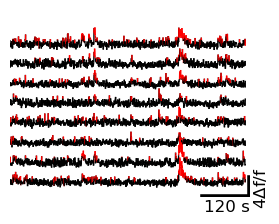

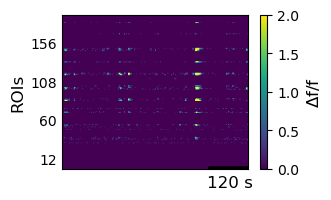

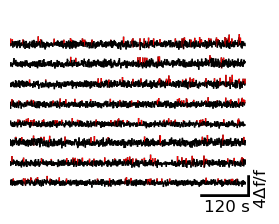

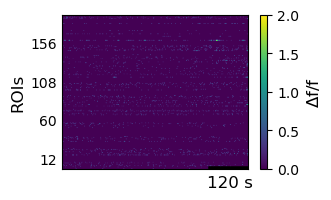

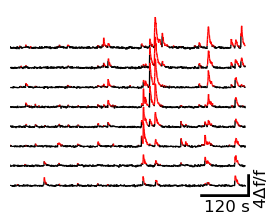

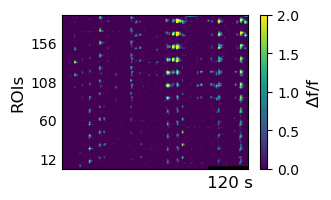

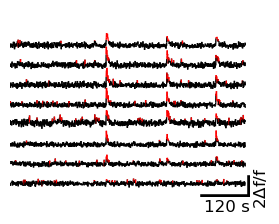

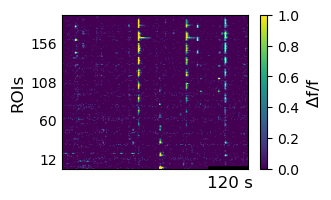

In [50]:
n_traces = 8
squash_factor = 2
fontsize = 12
fps = df['frameRate'][0]
ax_width = 1
fig_height = 1
xlim_trunc = 0.02
ylim_trunc=[2,2,2,1]


IDs = [
          "20200302-d1",
          "20200302-d2",
          "20190731-d1",
          "20190731-d2"
      ]

# ROIs
J = [
#         np.arange(54,64),
#         np.array([72+16*j for j in range(n_traces)]),
        np.array([72+16*j for j in range(n_traces-2)]+[42,58]),
        np.array([10+16*j for j in range(n_traces)]),
        np.array([8+16*j for j in range(n_traces)]),
        np.array([11+16*j for j in range(n_traces)]),
    ]

T = [
        np.arange(0,1300),
        np.arange(0,1300),
        np.arange(0,1300),
        np.arange(0,1300),
    ]


XBAR = [
           120,
           120,
           120,
           120,
       ]

YBAR = [
           4,
           4,
           4,
           2,
       ]

YMAX = [
           8,
           8,
           8,
           4,
       ]

LOC = [
          'S1',
          'V1',
          'S1',
          'V1',
      ]

stages = [24,24,25,25]

for dunnart_id,j,t,xbar,ybar,ymax,ymin,loc,stg in zip(IDs,J,T,XBAR,YBAR,YMAX,ylim_trunc,LOC,stages):
    d = df[df['Matlab ID']==dunnart_id].index.values[0]
    d = df[df['Matlab ID']==dunnart_id].index.values[0]
    fig, axs = plt.subplots(nrows=n_traces,ncols=1,figsize=(3,2))
    dff = F[d]
    dff = dff.reshape(dff.shape[0],-1)
    b = B[d]
    b = b.reshape(b.shape[0],-1)
    for k,ax in enumerate(axs):
        # Plot below threshold
        mask = b[t,:][:,j][:,k]
        y = dff[t,:][:,j][:,k]
        x = np.arange(y.size)/fps

        
        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        cmap = ListedColormap(['k', 'r'])
        norm = BoundaryNorm([0, 0.5, 1], cmap.N)
        lc = LineCollection(segments, linewidth=1, cmap=cmap, norm=norm)
        lc.set_array(mask)

        # Add a collection of lines
        ax.add_collection(lc)

        # Format
        ax.autoscale(enable=True,tight=True)
        xlim = ax.get_xlim()
        ax.set_xlim(
            [
                xlim[0],
                xlim[1] + np.ptp(xlim)*xlim_trunc
            ]
        )
        ylim = ax.get_ylim()
        ax.set_ylim(
            [
                ylim[0] - ymin,
                ymax
            ]
        )
        ax.axis('off')
        ax.set(facecolor = "none")
    
    # Add x-scale bar
    ax = axs[n_traces-1]
    data_to_axis = ax.transData + ax.transAxes.inverted()
    bar_len = data_to_axis.transform([
                                               (0,0),
                                               (xbar,0),
                                           ])[:,0]
    bar_len = np.abs(np.diff(bar_len)[0])
    x = [ax_width-bar_len,ax_width]
    y = [0,0]
    line = lines.Line2D(
        x,
        y,
        color='k',
        linewidth=4,
        linestyle='-',
        transform=ax.transAxes,
    )
    ax.add_line(line)
    pltstr = f'{xbar} s'
    ax.text(
        np.mean(x),
        y[0]-0.04,
        pltstr,
        ha='center',
        va='top',
        fontsize=fontsize,
        transform=ax.transAxes
    )
    
    # Add y-scale bar
    ax = axs[n_traces-1]
    bar_len = data_to_axis.transform([
                                               (0,0),
                                               (0,ybar),
                                           ])[:,1]
    bar_len = np.abs(np.diff(bar_len)[0])
    y = [0,bar_len]
    x = [ax_width,ax_width]
    line = lines.Line2D(
        x,
        y,
        color='k',
        linewidth=4,
        linestyle='-',
        transform=ax.transAxes,
    )
    ax.add_line(line)
    pltstr = f"{ybar}" + "$\Delta$f/f"
    ax.text(
        x[0]+0.01,
        np.mean(y),
        pltstr,
        ha='left',
        va='center',
        fontsize=fontsize,
        rotation=90,
        transform=ax.transAxes
    )
    
    
    
    # squash axes
    upper = axs[0].get_position().extents[3]
    lower = axs[n_traces-1].get_position().extents[1]
    for i,ax in enumerate(axs):
        height = (1/n_traces)*squash_factor
        pos = ax.get_position().bounds
#         pos = [p for p in pos[:3]] + [height]
        pos = [pos[0]-0.025, pos[1], pos[2]+0.025, height]
        ax.set_position(pos)
        
        
        
    fig.savefig(
    figpath / ('dff_large_'+ loc +'_' + str(stg) +'.pdf'),
#     bbox_inches='tight',
    transparent=True,
    pad_inches=0
    )
     
    # Plot thresholded raster
    fig,ax = plt.subplots(figsize=(3,2))
    pltimg = ax.imshow(
        (dff[t,:].T)*(b[t,:].T),
        vmin=0,
        vmax=ymax/4,
        interpolation=None,
        extent = [(t/fps)[0], (t/fps)[-1],-0.5,191.5],
    )
    cbar = fig.colorbar(pltimg, ax=ax)
    cbar.set_label("$\Delta$f/f",fontsize=fontsize,rotation=90)
    ax.set_aspect('auto')
    ax.set_xticks([])
    ax.set_yticks(np.arange(12,192,48))
    ax.tick_params(axis='y',length=0)
    ax.set_ylabel('ROIs',rotation=90,fontsize=fontsize)
    
    # Add x-scale bar
    data_to_axis = ax.transData + ax.transAxes.inverted()
    bar_len = data_to_axis.transform([
                                               (0,0),
                                               (xbar,0),
                                           ])[:,0]
    bar_len = np.abs(np.diff(bar_len)[0])
    x = [ax_width-bar_len,ax_width]
    y = [0,0]
    line = lines.Line2D(
        x,
        y,
        color='k',
        linewidth=4,
        linestyle='-',
        transform=ax.transAxes,
    )
    ax.add_line(line)
    pltstr = f'{xbar} s'
    ax.text(
        np.mean(x),
        y[0]-0.04,
        pltstr,
        ha='center',
        va='top',
        fontsize=fontsize,
        transform=ax.transAxes
    )
    
    fig.savefig(
    figpath / ('raster_large_'+ loc +'_' + str(stg) +'.pdf'),
    bbox_inches='tight',
    transparent=True,
    pad_inches=0
    )